In [1]:
from PIL import Image
import numpy as np
import cupy as cp
from matplotlib import pyplot, cm
from tqdm.notebook import tqdm
from IPython.display import display

In [2]:
def compute_coordinates(res, pitch):
    """Return an array of shape (res) containing the coordinates of a sampling lattice with given pitch."""
    indices = cp.arange(res)
    return (indices - res/2 + 0.5) * pitch

def compute_intervals(res, pitch):
    """Return an array of shape (res+1) containing the boundaries of each sampling cell."""
    indices = cp.arange(res+1)
    return (indices - res/2) * pitch

def ab_to_r(x_a, x_b, z_r, z_a, z_b, z_f):
    """Return the coordinates on the retina corresponding to the given coordinates on planes A and B."""
    return (x_a * (1.0 - z_b/z_f) - x_b * (1.0 - z_a/z_f)) * (z_r / (z_a - z_b))

def ra_to_p(x_r, x_a, z_r, z_a, z_f):
    """Return the coordinates on the pupil corresponding to the given coordinates on plane A and on the retina."""
    return (x_a - x_r * (z_a/z_r)) * np.reciprocal(1.0 - z_a/z_f)

def compute_imaging_tensor(x_r, ivl_a, ivl_b, z_r, z_a, z_b, z_f, pupil_diameter):
    """Return the flatland imaging tensor."""
    # Project intervals to the pupil
    ivl_a_at_p = ra_to_p(x_r, ivl_a, z_r, z_a, z_f)
    ivl_b_at_p = ra_to_p(x_r, ivl_b, z_r, z_b, z_f)
    # Bounds imposed by the pupil aperture
    lower_bound = -pupil_diameter/2
    upper_bound =  pupil_diameter/2
    # Restrict plane A intervals to the pupil aperture
    ivl_pa = cp.clip(ivl_a_at_p, lower_bound, upper_bound)
    # Bounds imposed by the pupil aperture and plane A intervals together
    lower_bound = cp.minimum(ivl_pa[..., :-1, :], ivl_pa[..., 1:, :])
    upper_bound = cp.maximum(ivl_pa[..., :-1, :], ivl_pa[..., 1:, :])
    # Restrict plane B intervals to the pupil aperture and plane A intervals
    ivl_pab = cp.clip(ivl_b_at_p, lower_bound, upper_bound)
    # Bounds imposed by the pupil aperture, plane A intervals and plane B intervals together
    lower_bound = cp.minimum(ivl_pab[..., :-1], ivl_pab[..., 1:])
    upper_bound = cp.maximum(ivl_pab[..., :-1], ivl_pab[..., 1:])
    # Return the lengths of the intervals normalized by the pupil diameter
    return cp.subtract(upper_bound, lower_bound) / pupil_diameter

def apply_imaging_tensor(img_tsr, signal_ab):
    """Return the image formed by the given imaging tensor over the given light field."""
    return cp.sum(img_tsr * signal_ab, axis=(-2, -1))

def convolution_matrix(x_in, x_out, kernel):
    """Return a convolution matrix with given kernel."""
    return kernel(x_out[..., np.newaxis] - x_in)

def cosine_signal(x, frequency, phase=0.0):
    """Sample a cosine with given frequency and phase at given sampling coordinates."""
    return cp.cos((x * frequency + phase) * 2 * np.pi)/2 + 0.5

def sample_lf(x_a, x_b, z_r, z_a, z_b, z_f, frequency):
    """Return the sampled light field signal over planes A and B with given frequency at the retina."""
    x_r_over_ab = ab_to_r(x_a, x_b, z_r, z_a, z_b, z_f)
    return cosine_signal(x_r_over_ab, frequency)

def decimate_lf(signal_ab, factor):
    """Return the light field decimated by given factor."""
    return signal_ab[factor//2::factor, factor//2::factor]

def filter_lf(signal_ab, filter_kernel):
    """Return the light field filtered on the frequency domain by a given kernel."""
    return cp.real(cp.fft.ifft2(cp.fft.fft2(signal_ab) * filter_kernel))

def downsample_lf(signal_ab, factor, filter_kernel=1.0, clip_negative=True):
    """Return a light field downsampled by given factor and prefiltered with given kernel."""
    filtered_signal_ab = filter_lf(signal_ab, filter_kernel)
    downsampled_signal_ab = decimate_lf(filtered_signal_ab, supersampling)
    return cp.maximum(downsampled_signal_ab, 0.0) if clip_negative else downsampled_signal_ab

def create_filter(omega_a, omega_b, z_r, z_a, z_b, z_near, z_far, xi_r, xi_p=0.0):
    """Return an hourglass-shaped filter defined from near and far focus distance and maximum frequency at the retina."""
    mask_near = (z_near * (omega_a + omega_b) - z_a * omega_a - z_b * omega_b) < 0
    mask_far = (z_far * (omega_a + omega_b) - z_a * omega_a - z_b * omega_b) > 0
    mask_depth = cp.logical_not(cp.logical_xor(mask_near, mask_far))
    mask_p_near = cp.abs((1 - z_a/z_near) * omega_a + (1 - z_b/z_near) * omega_b) < xi_p
    mask_p_far = cp.abs((1 - z_a/z_far) * omega_a + (1 - z_b/z_far) * omega_b) < xi_p
    mask_p = cp.logical_or(mask_p_near, mask_p_far)
    mask_r = cp.abs(z_a * omega_a + z_b * omega_b) < abs(z_r) * xi_r
    return cp.logical_and(mask_r, cp.logical_or(mask_depth, mask_p)) * 1.0

def display_image(values, normalize=True, color_map=None):
    """Display an array of values as an image using a color map."""
    values = values * np.nan_to_num(np.reciprocal(np.amax(values))) if normalize else values
    color_values = cm.get_cmap(color_map)(values)
    uint8_values = (color_values * 255).astype(np.uint8)
    display(Image.fromarray(uint8_values).transpose(Image.ROTATE_90))

In [3]:
z_r = -17.0
z_a = 10.0
z_b = 30.0
z_near = 50.0
z_far = cp.inf

pupil_diameter = 5.0

size_r = 5.5
size_a = size_r * z_a / abs(z_r) + pupil_diameter
size_b = size_r * z_b / abs(z_r) + pupil_diameter

res_r = 512
res_a = 64
res_b = 64
supersampling = 5 # This value must be an odd number!

pitch_r = size_r / res_r
pitch_a = size_a / res_a
pitch_b = size_b / res_b

xi_r = 0.5 / pitch_r
xi_a = 0.5 / pitch_a
xi_b = 0.5 / pitch_b

In [4]:
x_r = compute_coordinates(res_r, pitch_r)
omega_r =  cp.fft.fftfreq(res_r, pitch_r)

x_a = compute_coordinates(res_a, pitch_a)[    ::    , np.newaxis]
omega_a =  cp.fft.fftfreq(res_a, pitch_a)[    ::    , np.newaxis]

x_b = compute_coordinates(res_b, pitch_b)[np.newaxis,     ::    ]
omega_b =  cp.fft.fftfreq(res_b, pitch_b)[np.newaxis,     ::    ]

x_a_sup = compute_coordinates(res_a*supersampling, pitch_a/supersampling)[    ::    , np.newaxis]
omega_a_sup =  cp.fft.fftfreq(res_a*supersampling, pitch_a/supersampling)[    ::    , np.newaxis]

x_b_sup = compute_coordinates(res_b*supersampling, pitch_b/supersampling)[np.newaxis,     ::    ]
omega_b_sup =  cp.fft.fftfreq(res_b*supersampling, pitch_b/supersampling)[np.newaxis,     ::    ]

ivl_a = compute_intervals(res_a, pitch_a)[    ::    , np.newaxis]
ivl_b = compute_intervals(res_b, pitch_b)[np.newaxis,     ::    ]

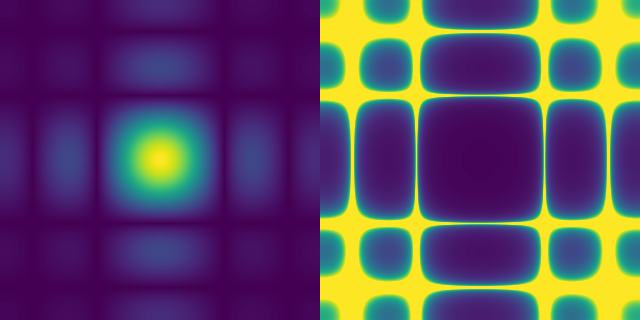

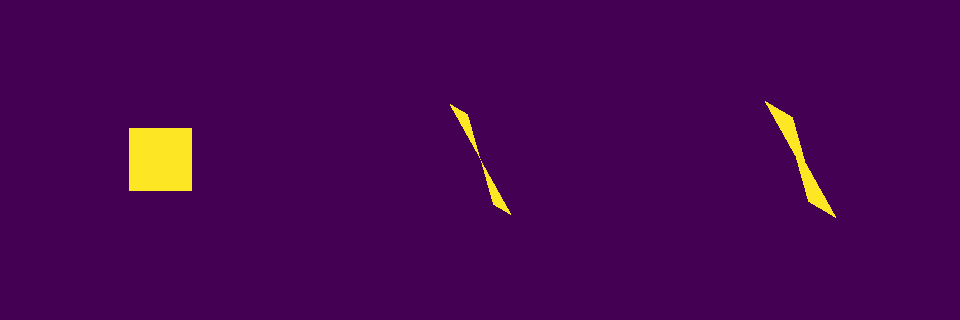

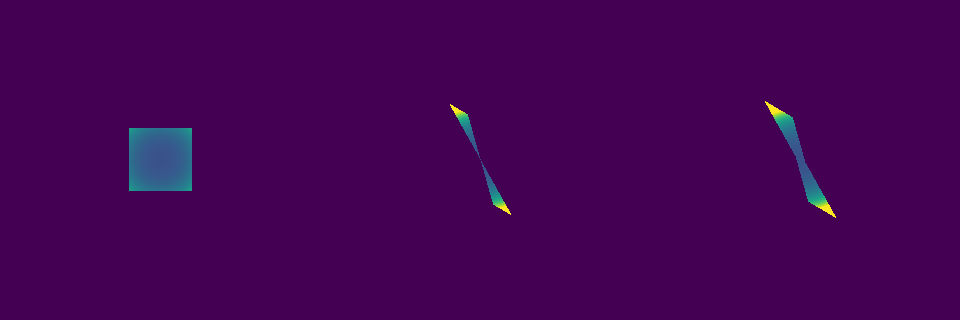

In [5]:
sinc_filter = cp.sinc(omega_a_sup * pitch_a) * cp.sinc(omega_b_sup * pitch_b)
unsinc_filter = cp.nan_to_num(cp.reciprocal(sinc_filter))

display_image(cp.vstack((cp.fft.fftshift(cp.abs(sinc_filter)),
                         cp.fft.fftshift(cp.abs(unsinc_filter)/100.0) )).get(), False)

box_filter = cp.logical_and(cp.abs(omega_a_sup) < xi_a, cp.abs(omega_b_sup) < xi_b) * 1.0
thin_hg_filter = create_filter(omega_a_sup, omega_b_sup, z_r, z_a, z_b, z_near, z_far, 4.5)
thick_hg_filter = create_filter(omega_a_sup, omega_b_sup, z_r, z_a, z_b, z_near, z_far, 4.5, 0.4)

display_image(cp.vstack((cp.fft.fftshift(box_filter),
                         cp.fft.fftshift(thin_hg_filter),
                         cp.fft.fftshift(thick_hg_filter) )).get(), False)

unsinc_box_filter = box_filter * unsinc_filter
unsinc_thin_hg_filter = thin_hg_filter * unsinc_filter
unsinc_thick_hg_filter = thick_hg_filter * unsinc_filter

display_image(cp.vstack((cp.fft.fftshift(unsinc_box_filter),
                         cp.fft.fftshift(unsinc_thin_hg_filter),
                         cp.fft.fftshift(unsinc_thick_hg_filter) )).get()/4.0, False)

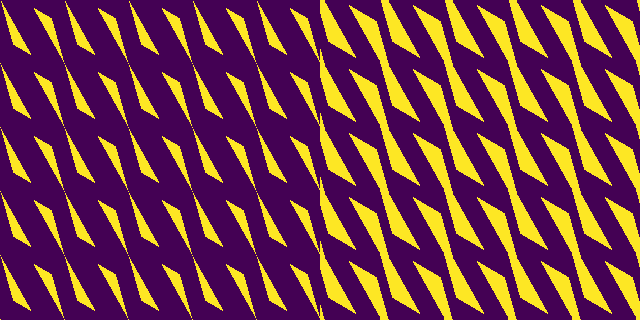

In [6]:
thin_spectrum = cp.abs(cp.fft.fft2(decimate_lf(cp.fft.ifft2(thin_hg_filter), supersampling)))
thick_spectrum = cp.abs(cp.fft.fft2(decimate_lf(cp.fft.ifft2(thick_hg_filter), supersampling)))

display_image(cp.vstack((cp.tile(thin_spectrum/cp.amax(thin_spectrum), (5, 5)),
                         cp.tile(thick_spectrum/cp.amax(thick_spectrum), (5, 5)))).get())

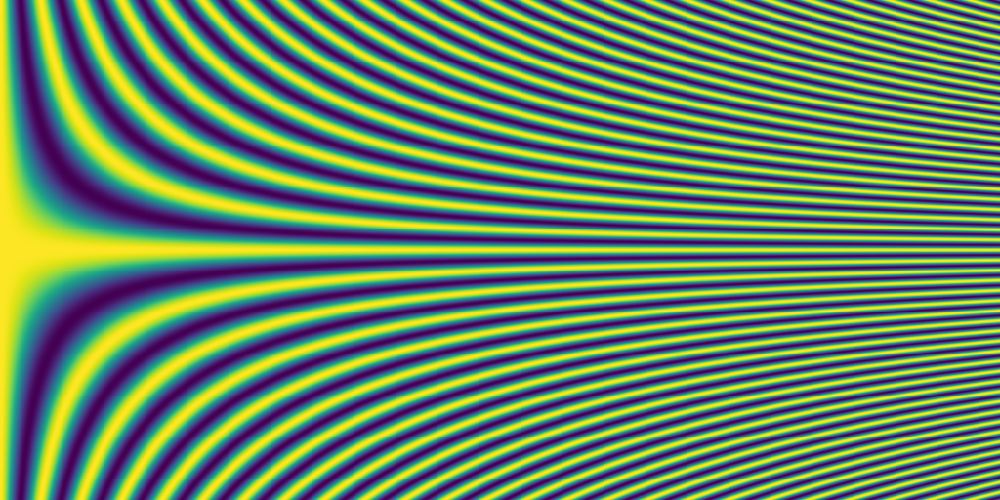

In [7]:
ground_truth = np.zeros((1024, res_r))

for idx, frequency in enumerate(np.linspace(0.0, 9.0, 1024)):
    ground_truth[idx] = cosine_signal(x_r, frequency).get()

display_image(ground_truth, False)

In [8]:
z_f = 100.0
img_tsr = compute_imaging_tensor(x_r[..., np.newaxis, np.newaxis], ivl_a, ivl_b, z_r, z_a, z_b, z_f, pupil_diameter)

unfiltered_result = np.zeros((1024, res_r))
unsinc_l_result = np.zeros((1024, res_r))
cliped_unsinc_l_result = np.zeros((1024, res_r))
unsinc_h_result = np.zeros((1024, res_r))
cliped_unsinc_h_result = np.zeros((1024, res_r))
box_result = np.zeros((1024, res_r))
cliped_box_result = np.zeros((1024, res_r))
unsinc_box_result = np.zeros((1024, res_r))
cliped_unsinc_box_result = np.zeros((1024, res_r))
thin_hg_result = np.zeros((1024, res_r))
cliped_thin_hg_result = np.zeros((1024, res_r))
unsinc_thin_hg_result = np.zeros((1024, res_r))
cliped_unsinc_thin_hg_result = np.zeros((1024, res_r))
thick_hg_result = np.zeros((1024, res_r))
cliped_thick_hg_result = np.zeros((1024, res_r))
unsinc_thick_hg_result = np.zeros((1024, res_r))
cliped_unsinc_thick_hg_result = np.zeros((1024, res_r))

for idx, frequency in enumerate(tqdm(np.linspace(0.0, 9.0, 1024))):
    signal_ab_sup = sample_lf(x_a_sup, x_b_sup, z_r, z_a, z_b, z_f, frequency)


    signal_ab = downsample_lf(signal_ab_sup, supersampling, 1.0, True)
    unfiltered_result[idx] = apply_imaging_tensor(img_tsr, signal_ab).get()



    signal_ab = downsample_lf(signal_ab_sup, supersampling, cp.clip(unsinc_filter, -2.0, 2.0), False)
    unsinc_l_result[idx] = apply_imaging_tensor(img_tsr, signal_ab).get()

    signal_ab = downsample_lf(signal_ab_sup, supersampling, cp.clip(unsinc_filter, -2.0, 2.0), True)
    cliped_unsinc_l_result[idx] = apply_imaging_tensor(img_tsr, signal_ab).get()


    signal_ab = downsample_lf(signal_ab_sup, supersampling, cp.clip(unsinc_filter, -10.0, 10.0), False)
    unsinc_h_result[idx] = apply_imaging_tensor(img_tsr, signal_ab).get()

    signal_ab = downsample_lf(signal_ab_sup, supersampling, cp.clip(unsinc_filter, -10.0, 10.0), True)
    cliped_unsinc_h_result[idx] = apply_imaging_tensor(img_tsr, signal_ab).get()



    signal_ab = downsample_lf(signal_ab_sup, supersampling, box_filter, False)
    box_result[idx] = apply_imaging_tensor(img_tsr, signal_ab).get()

    signal_ab = downsample_lf(signal_ab_sup, supersampling, box_filter, True)
    cliped_box_result[idx] = apply_imaging_tensor(img_tsr, signal_ab).get()


    signal_ab = downsample_lf(signal_ab_sup, supersampling, unsinc_box_filter, False)
    unsinc_box_result[idx] = apply_imaging_tensor(img_tsr, signal_ab).get()

    signal_ab = downsample_lf(signal_ab_sup, supersampling, unsinc_box_filter, True)
    cliped_unsinc_box_result[idx] = apply_imaging_tensor(img_tsr, signal_ab).get()



    signal_ab = downsample_lf(signal_ab_sup, supersampling, thin_hg_filter, False)
    thin_hg_result[idx] = apply_imaging_tensor(img_tsr, signal_ab).get()

    signal_ab = downsample_lf(signal_ab_sup, supersampling, thin_hg_filter, True)
    cliped_thin_hg_result[idx] = apply_imaging_tensor(img_tsr, signal_ab).get()


    signal_ab = downsample_lf(signal_ab_sup, supersampling, unsinc_thin_hg_filter, False)
    unsinc_thin_hg_result[idx] = apply_imaging_tensor(img_tsr, signal_ab).get()

    signal_ab = downsample_lf(signal_ab_sup, supersampling, unsinc_thin_hg_filter, True)
    cliped_unsinc_thin_hg_result[idx] = apply_imaging_tensor(img_tsr, signal_ab).get()



    signal_ab = downsample_lf(signal_ab_sup, supersampling, thick_hg_filter, False)
    thick_hg_result[idx] = apply_imaging_tensor(img_tsr, signal_ab).get()

    signal_ab = downsample_lf(signal_ab_sup, supersampling, thick_hg_filter, True)
    cliped_thick_hg_result[idx] = apply_imaging_tensor(img_tsr, signal_ab).get()


    signal_ab = downsample_lf(signal_ab_sup, supersampling, unsinc_thick_hg_filter, False)
    unsinc_thick_hg_result[idx] = apply_imaging_tensor(img_tsr, signal_ab).get()

    signal_ab = downsample_lf(signal_ab_sup, supersampling, unsinc_thick_hg_filter, True)
    cliped_unsinc_thick_hg_result[idx] = apply_imaging_tensor(img_tsr, signal_ab).get()

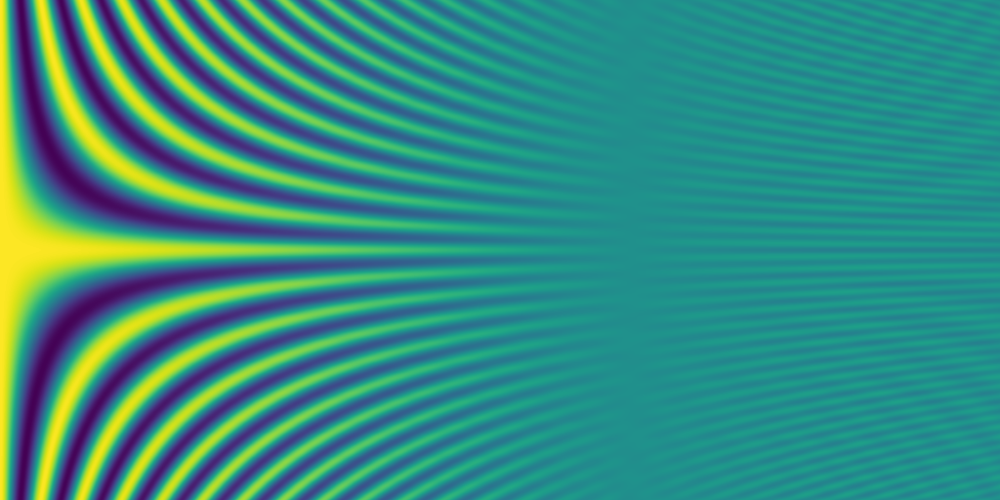

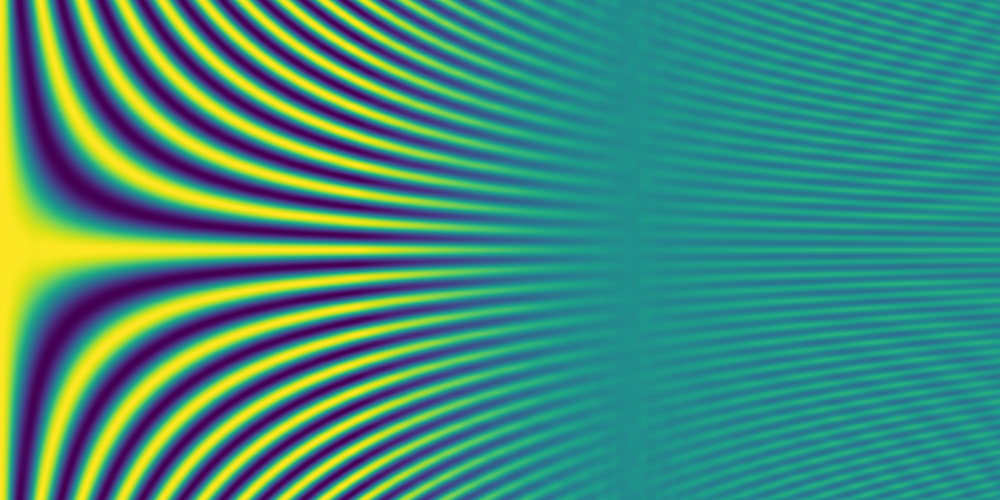

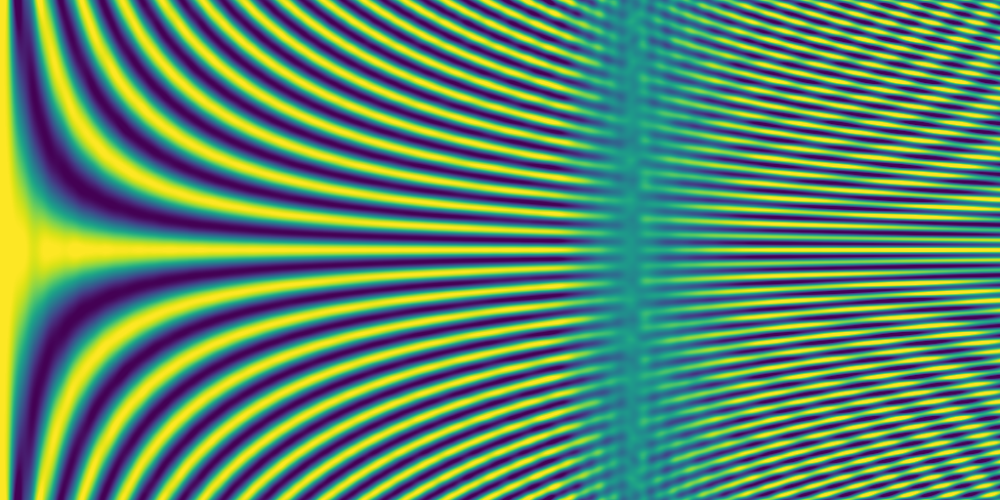

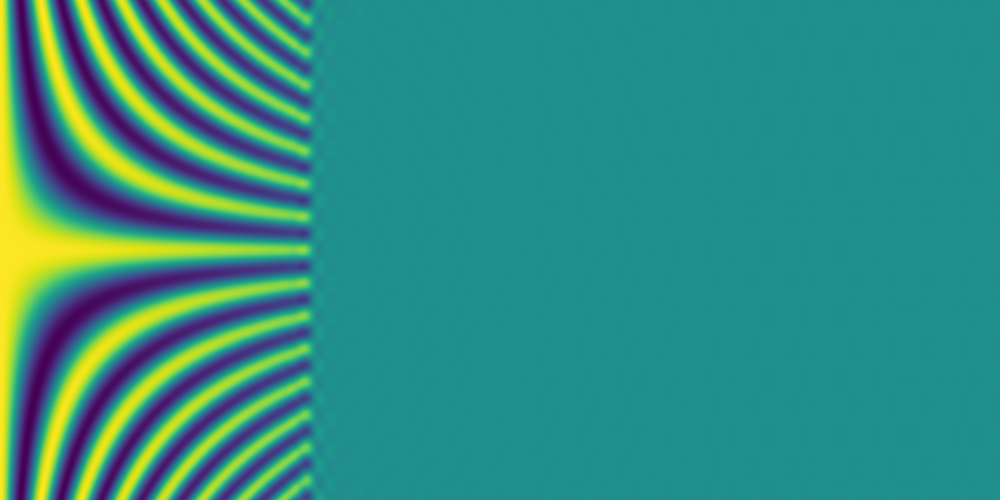

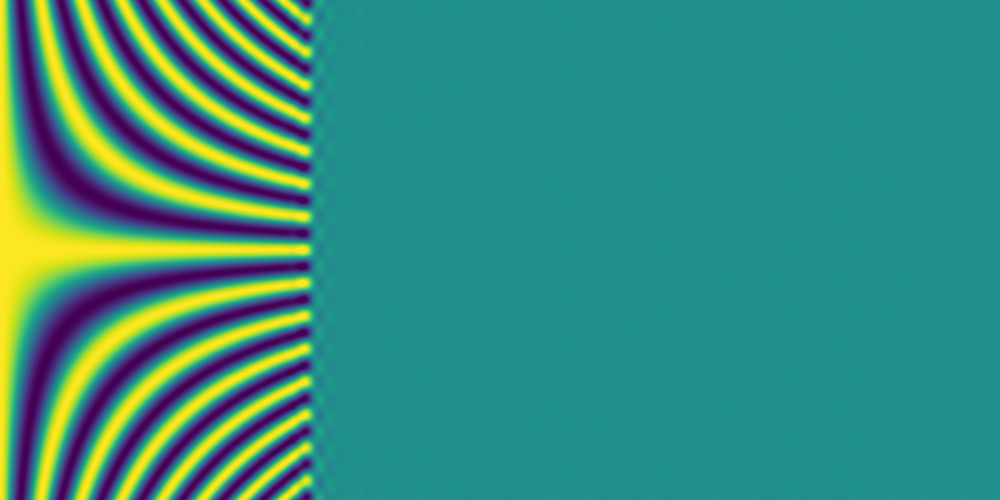

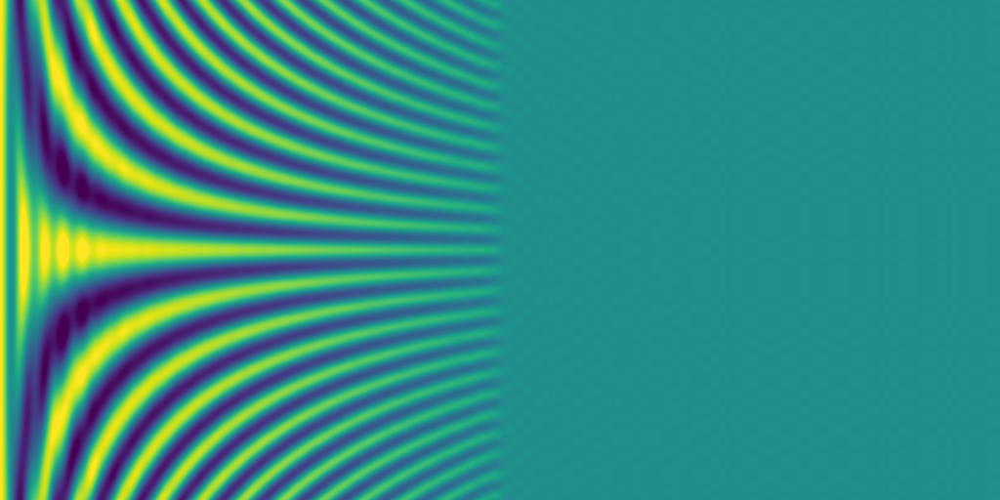

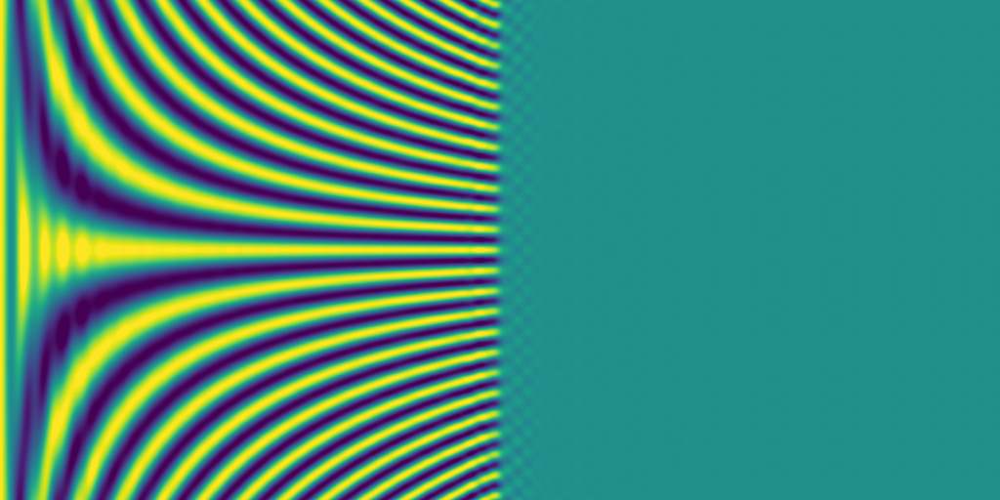

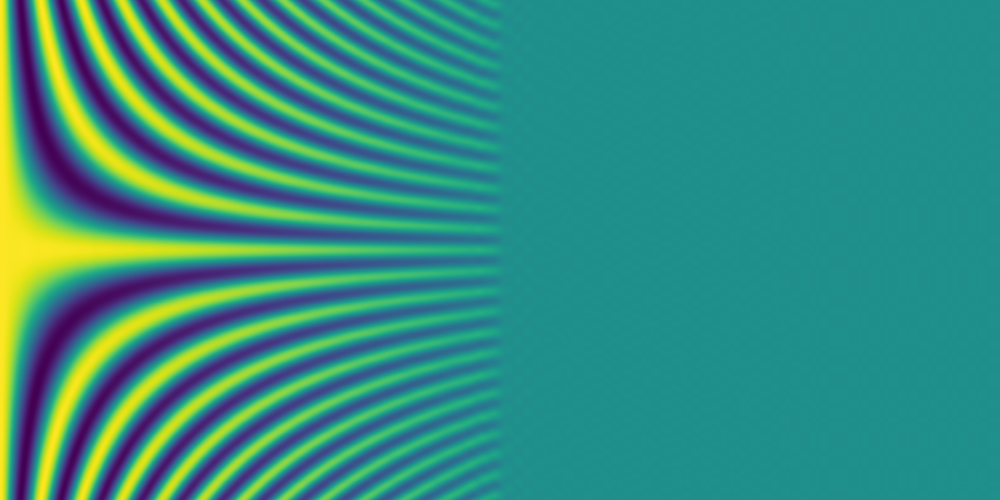

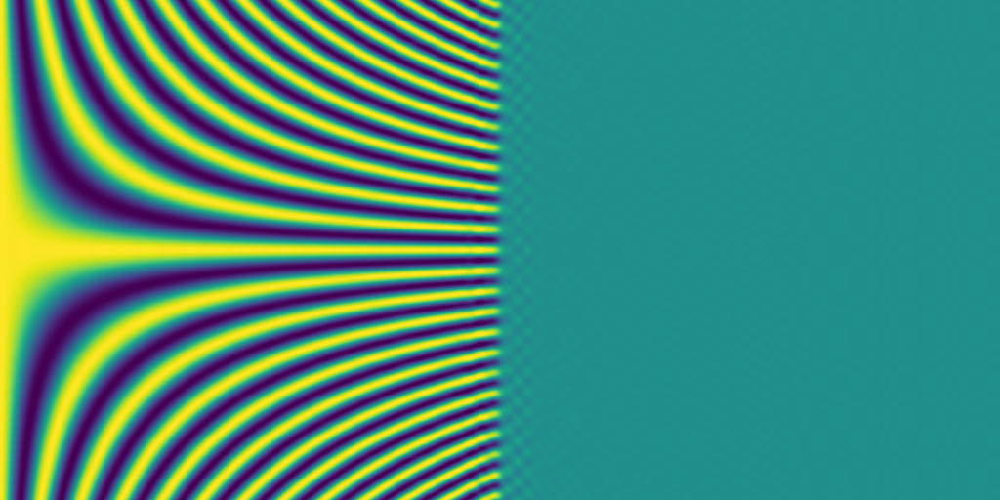

In [9]:
display_image(unfiltered_result, False)
display_image(unsinc_l_result, False)
display_image(unsinc_h_result, False)
display_image(box_result, False)
display_image(unsinc_box_result, False)
display_image(thin_hg_result, False)
display_image(unsinc_thin_hg_result, False)
display_image(thick_hg_result, False)
display_image(unsinc_thick_hg_result, False)

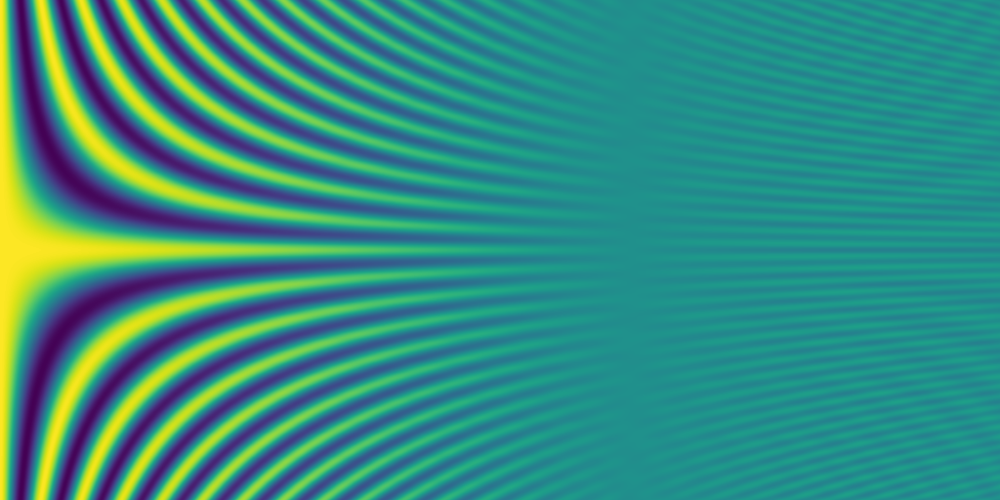

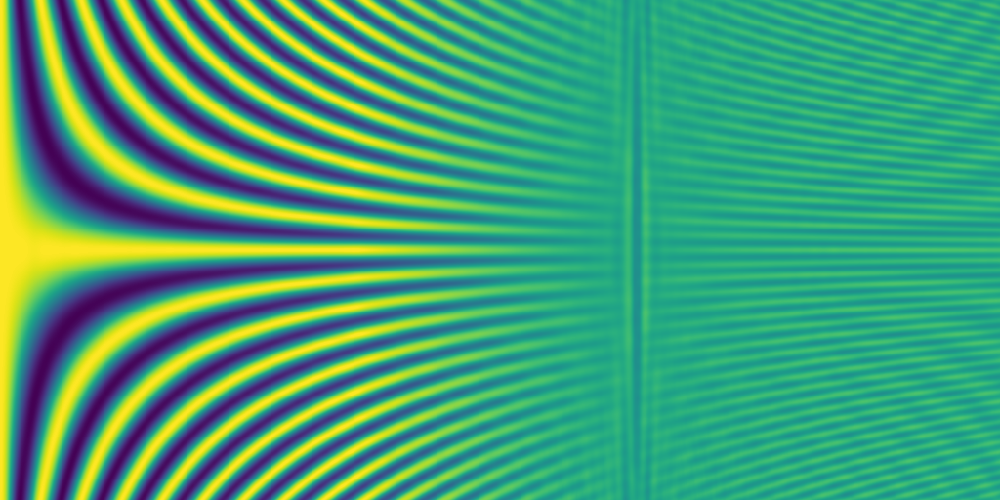

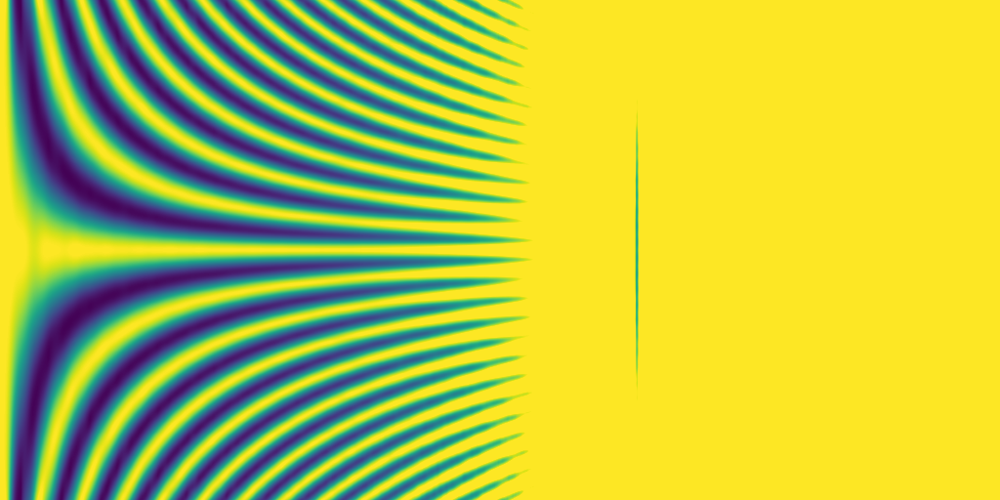

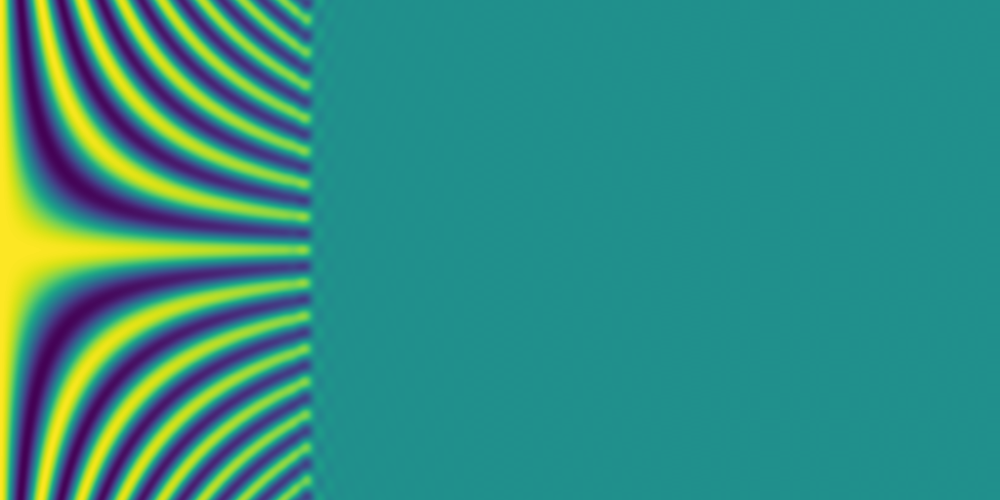

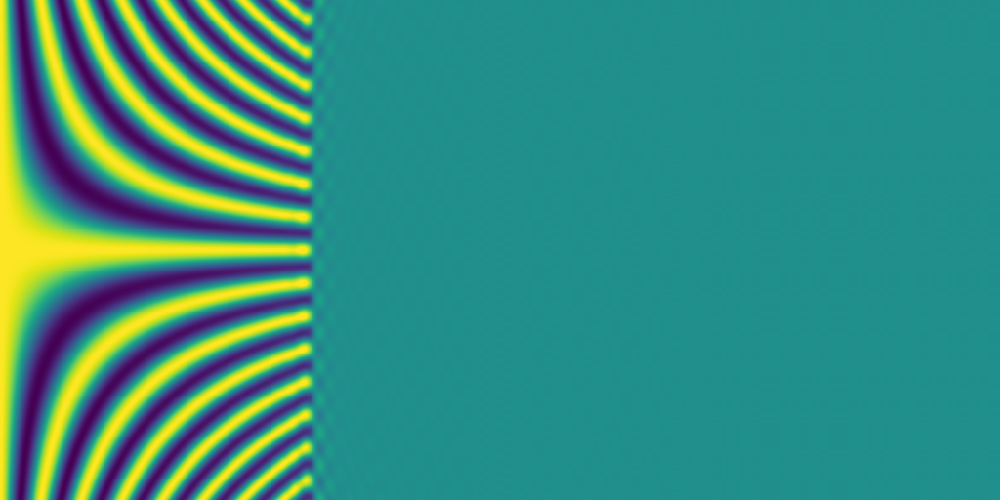

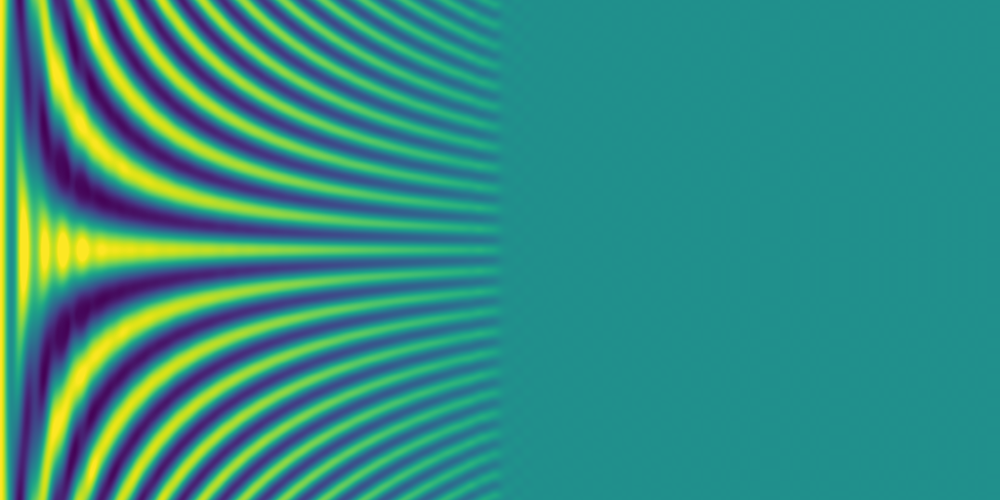

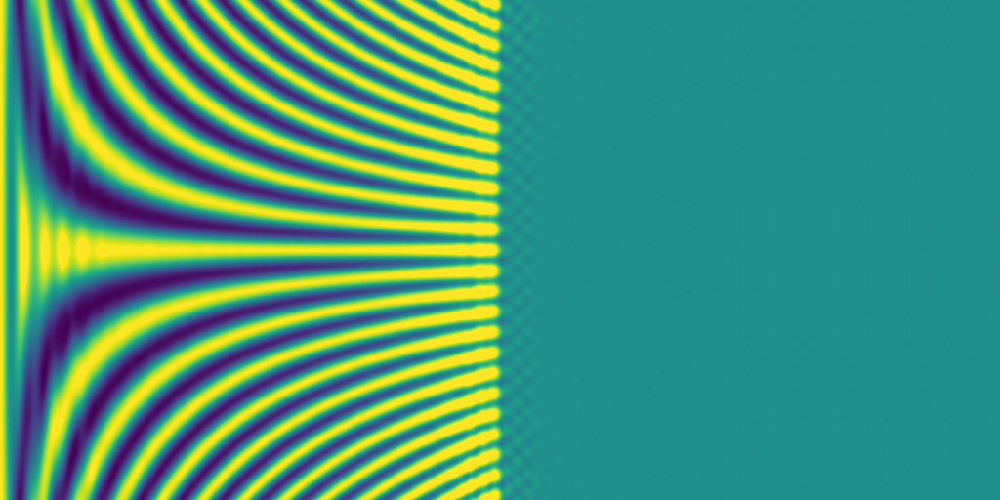

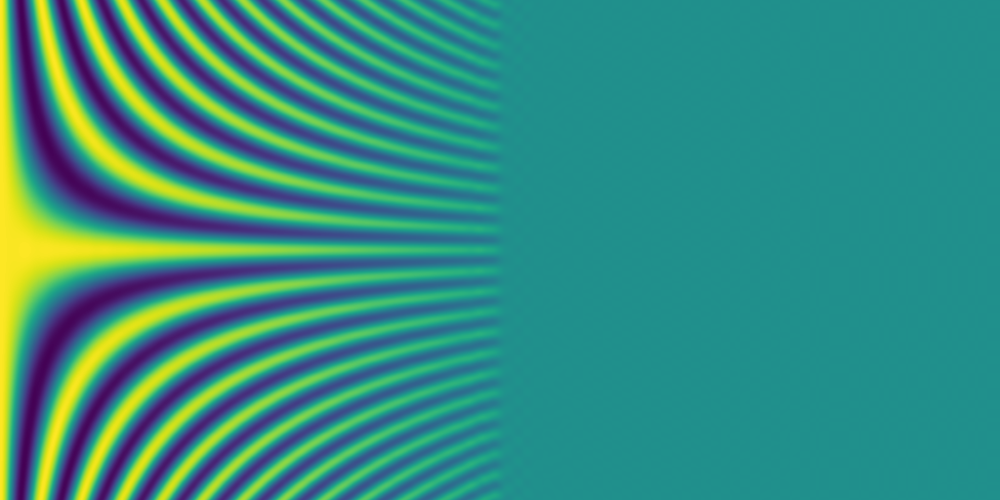

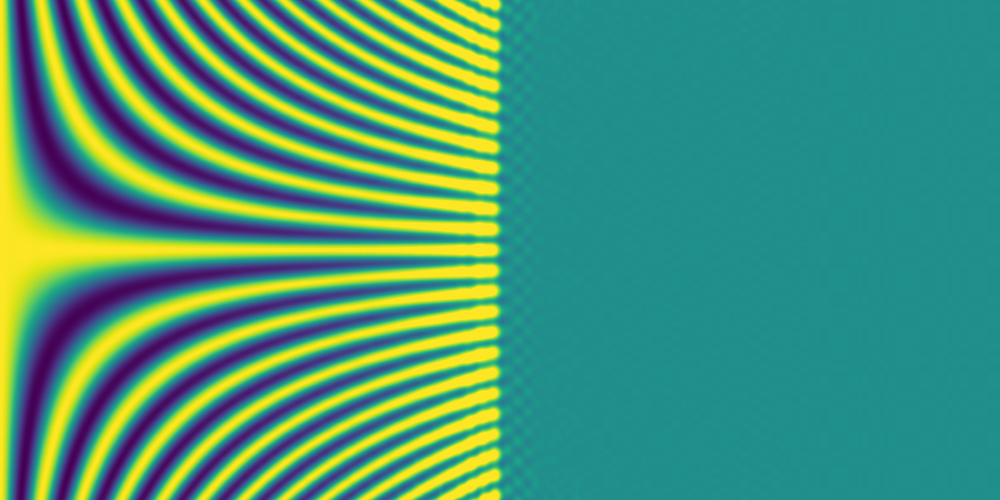

In [10]:
display_image(unfiltered_result, False)
display_image(cliped_unsinc_l_result, False)
display_image(cliped_unsinc_h_result, False)
display_image(cliped_box_result, False)
display_image(cliped_unsinc_box_result, False)
display_image(cliped_thin_hg_result, False)
display_image(cliped_unsinc_thin_hg_result, False)
display_image(cliped_thick_hg_result, False)
display_image(cliped_unsinc_thick_hg_result, False)

In [11]:
z_f = 20.0
img_tsr = compute_imaging_tensor(x_r[..., np.newaxis, np.newaxis], ivl_a, ivl_b, z_r, z_a, z_b, z_f, pupil_diameter)

unfiltered_result = np.zeros((1024, res_r))
unsinc_l_result = np.zeros((1024, res_r))
cliped_unsinc_l_result = np.zeros((1024, res_r))
unsinc_h_result = np.zeros((1024, res_r))
cliped_unsinc_h_result = np.zeros((1024, res_r))
box_result = np.zeros((1024, res_r))
cliped_box_result = np.zeros((1024, res_r))
unsinc_box_result = np.zeros((1024, res_r))
cliped_unsinc_box_result = np.zeros((1024, res_r))
thin_hg_result = np.zeros((1024, res_r))
cliped_thin_hg_result = np.zeros((1024, res_r))
unsinc_thin_hg_result = np.zeros((1024, res_r))
cliped_unsinc_thin_hg_result = np.zeros((1024, res_r))
thick_hg_result = np.zeros((1024, res_r))
cliped_thick_hg_result = np.zeros((1024, res_r))
unsinc_thick_hg_result = np.zeros((1024, res_r))
cliped_unsinc_thick_hg_result = np.zeros((1024, res_r))

for idx, frequency in enumerate(tqdm(np.linspace(0.0, 9.0, 1024))):
    signal_ab_sup = sample_lf(x_a_sup, x_b_sup, z_r, z_a, z_b, z_f, frequency)


    signal_ab = downsample_lf(signal_ab_sup, supersampling, 1.0, True)
    unfiltered_result[idx] = apply_imaging_tensor(img_tsr, signal_ab).get()



    signal_ab = downsample_lf(signal_ab_sup, supersampling, cp.clip(unsinc_filter, -2.0, 2.0), False)
    unsinc_l_result[idx] = apply_imaging_tensor(img_tsr, signal_ab).get()

    signal_ab = downsample_lf(signal_ab_sup, supersampling, cp.clip(unsinc_filter, -2.0, 2.0), True)
    cliped_unsinc_l_result[idx] = apply_imaging_tensor(img_tsr, signal_ab).get()


    signal_ab = downsample_lf(signal_ab_sup, supersampling, cp.clip(unsinc_filter, -10.0, 10.0), False)
    unsinc_h_result[idx] = apply_imaging_tensor(img_tsr, signal_ab).get()

    signal_ab = downsample_lf(signal_ab_sup, supersampling, cp.clip(unsinc_filter, -10.0, 10.0), True)
    cliped_unsinc_h_result[idx] = apply_imaging_tensor(img_tsr, signal_ab).get()



    signal_ab = downsample_lf(signal_ab_sup, supersampling, box_filter, False)
    box_result[idx] = apply_imaging_tensor(img_tsr, signal_ab).get()

    signal_ab = downsample_lf(signal_ab_sup, supersampling, box_filter, True)
    cliped_box_result[idx] = apply_imaging_tensor(img_tsr, signal_ab).get()


    signal_ab = downsample_lf(signal_ab_sup, supersampling, unsinc_box_filter, False)
    unsinc_box_result[idx] = apply_imaging_tensor(img_tsr, signal_ab).get()

    signal_ab = downsample_lf(signal_ab_sup, supersampling, unsinc_box_filter, True)
    cliped_unsinc_box_result[idx] = apply_imaging_tensor(img_tsr, signal_ab).get()



    signal_ab = downsample_lf(signal_ab_sup, supersampling, thin_hg_filter, False)
    thin_hg_result[idx] = apply_imaging_tensor(img_tsr, signal_ab).get()

    signal_ab = downsample_lf(signal_ab_sup, supersampling, thin_hg_filter, True)
    cliped_thin_hg_result[idx] = apply_imaging_tensor(img_tsr, signal_ab).get()


    signal_ab = downsample_lf(signal_ab_sup, supersampling, unsinc_thin_hg_filter, False)
    unsinc_thin_hg_result[idx] = apply_imaging_tensor(img_tsr, signal_ab).get()

    signal_ab = downsample_lf(signal_ab_sup, supersampling, unsinc_thin_hg_filter, True)
    cliped_unsinc_thin_hg_result[idx] = apply_imaging_tensor(img_tsr, signal_ab).get()



    signal_ab = downsample_lf(signal_ab_sup, supersampling, thick_hg_filter, False)
    thick_hg_result[idx] = apply_imaging_tensor(img_tsr, signal_ab).get()

    signal_ab = downsample_lf(signal_ab_sup, supersampling, thick_hg_filter, True)
    cliped_thick_hg_result[idx] = apply_imaging_tensor(img_tsr, signal_ab).get()


    signal_ab = downsample_lf(signal_ab_sup, supersampling, unsinc_thick_hg_filter, False)
    unsinc_thick_hg_result[idx] = apply_imaging_tensor(img_tsr, signal_ab).get()

    signal_ab = downsample_lf(signal_ab_sup, supersampling, unsinc_thick_hg_filter, True)
    cliped_unsinc_thick_hg_result[idx] = apply_imaging_tensor(img_tsr, signal_ab).get()

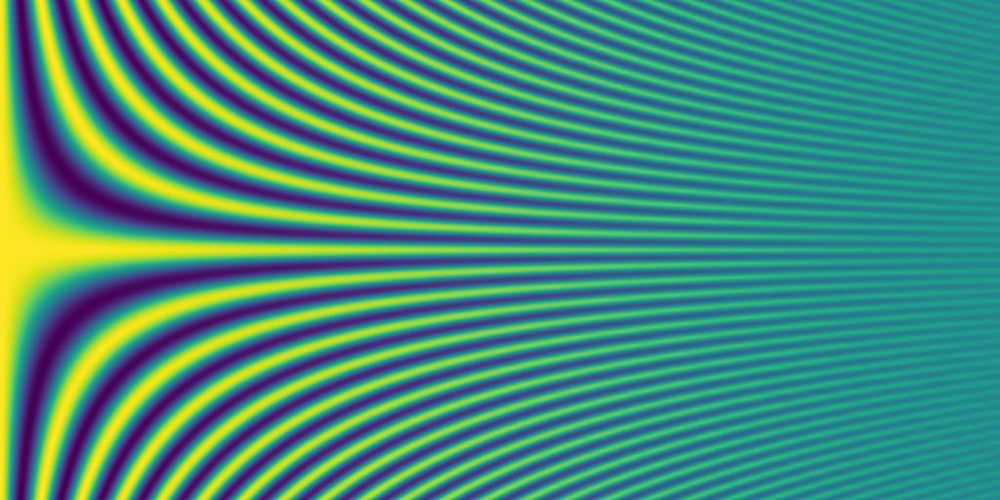

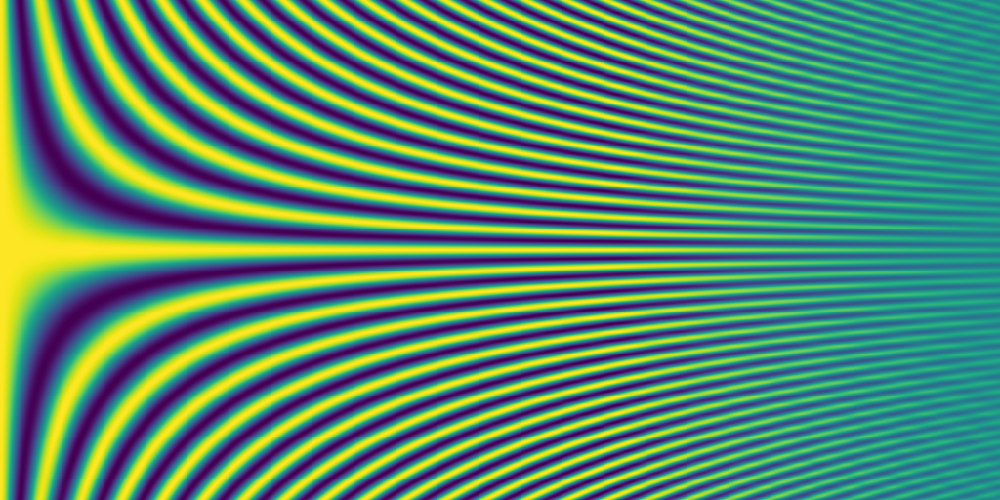

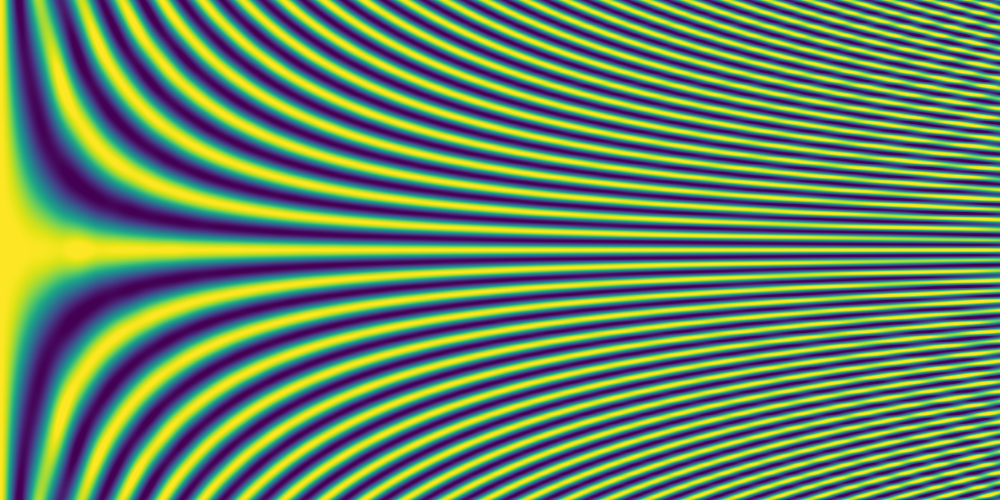

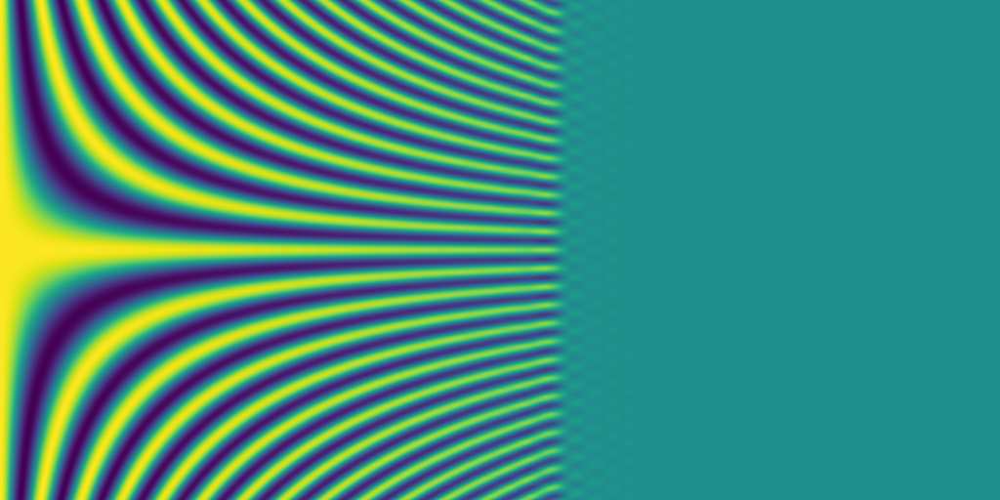

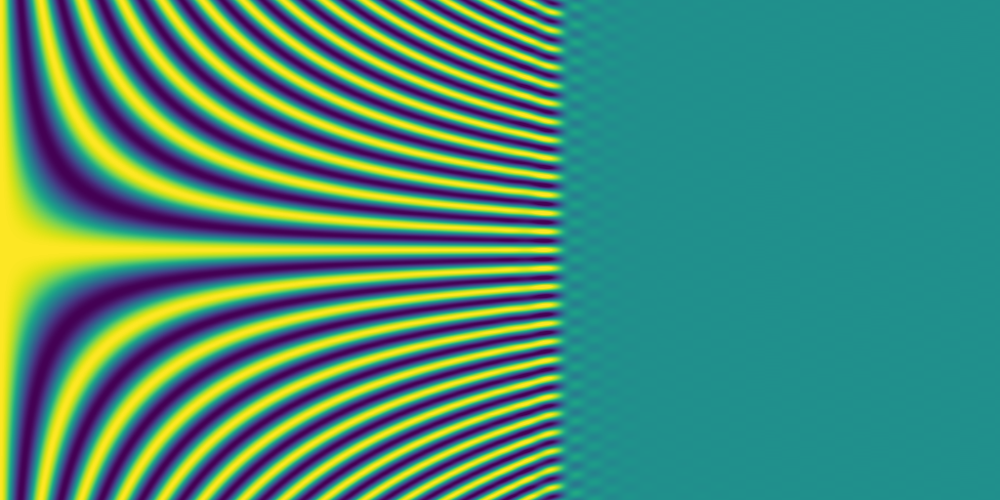

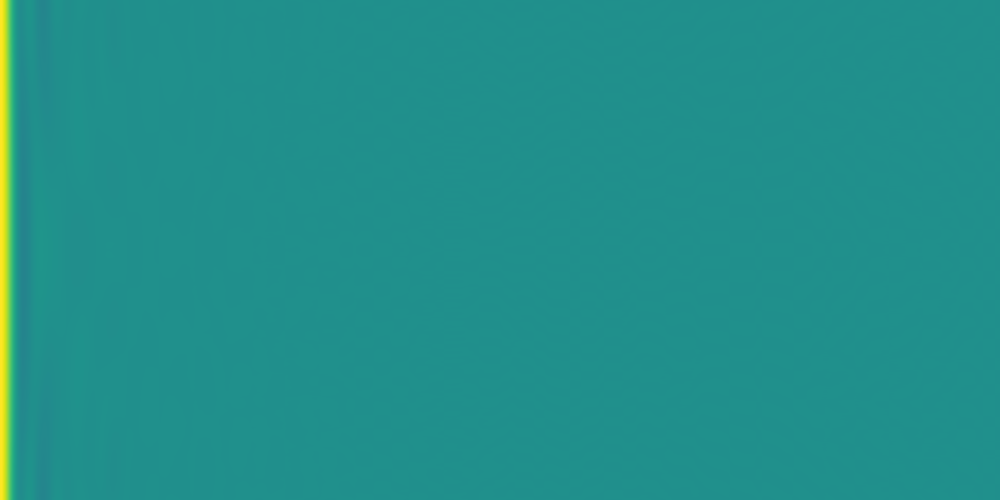

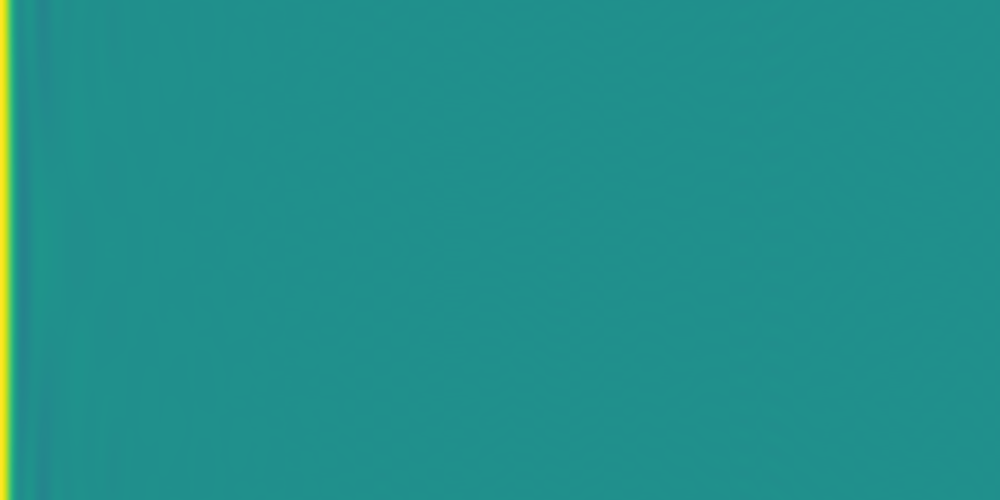

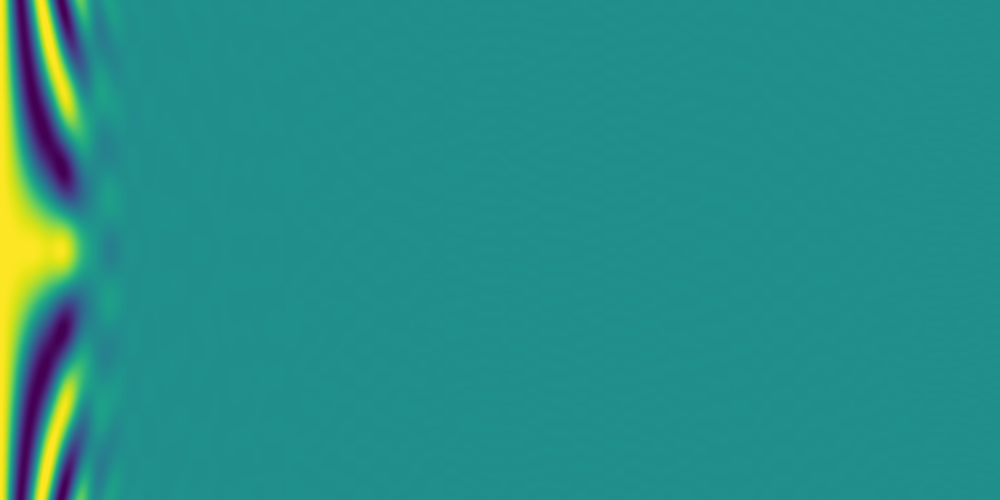

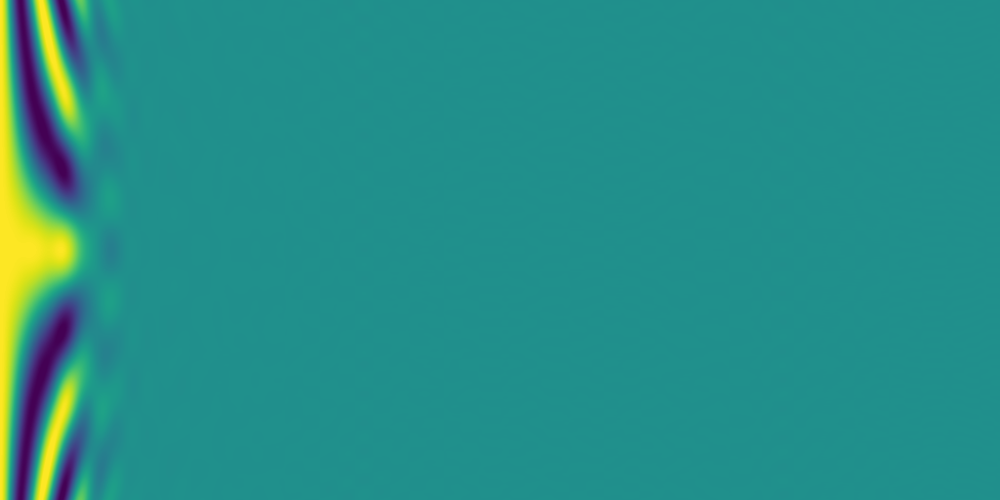

In [12]:
display_image(unfiltered_result, False)
display_image(unsinc_l_result, False)
display_image(unsinc_h_result, False)
display_image(box_result, False)
display_image(unsinc_box_result, False)
display_image(thin_hg_result, False)
display_image(unsinc_thin_hg_result, False)
display_image(thick_hg_result, False)
display_image(unsinc_thick_hg_result, False)

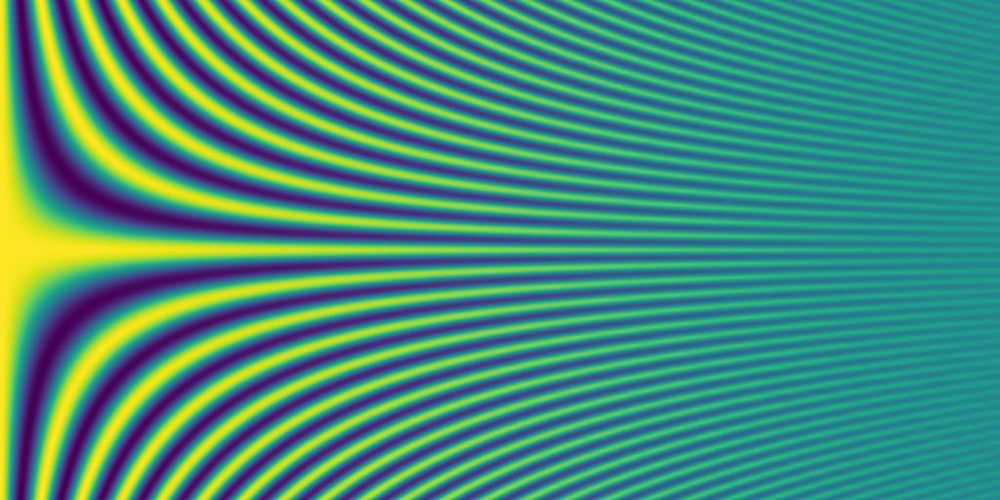

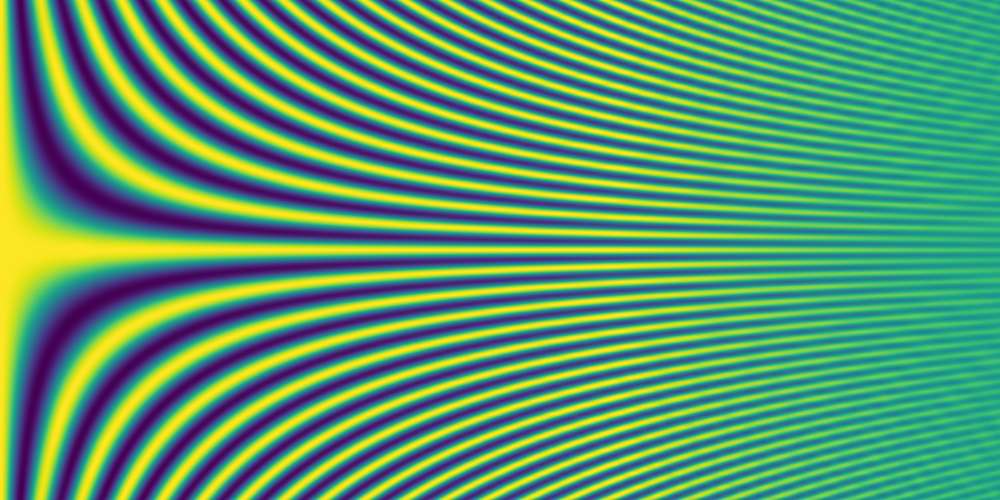

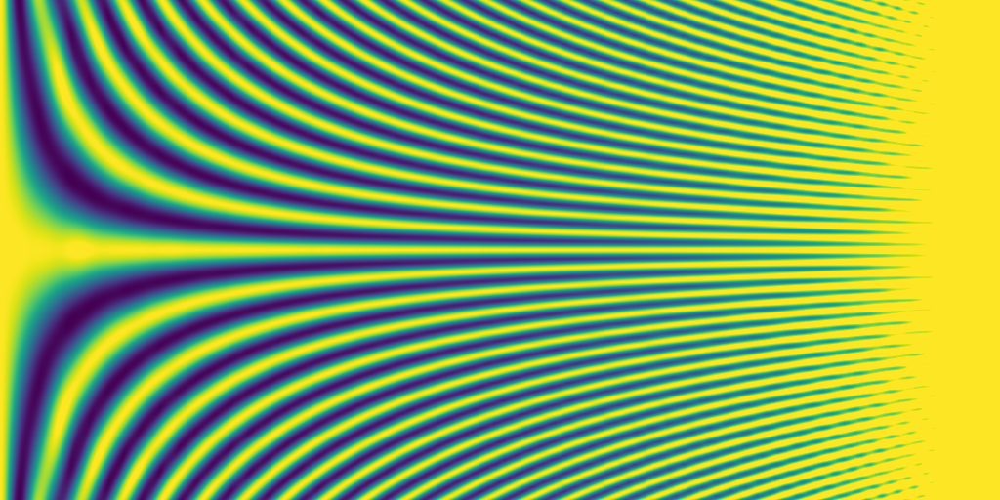

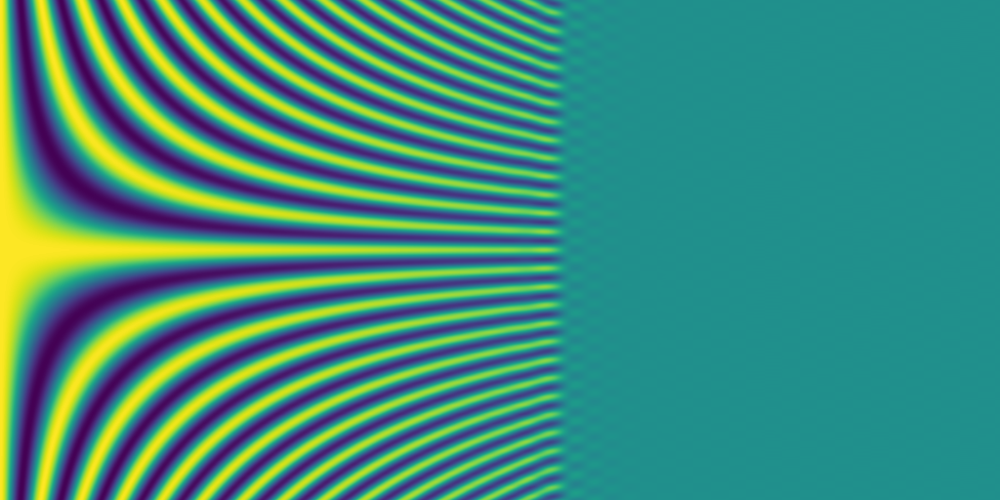

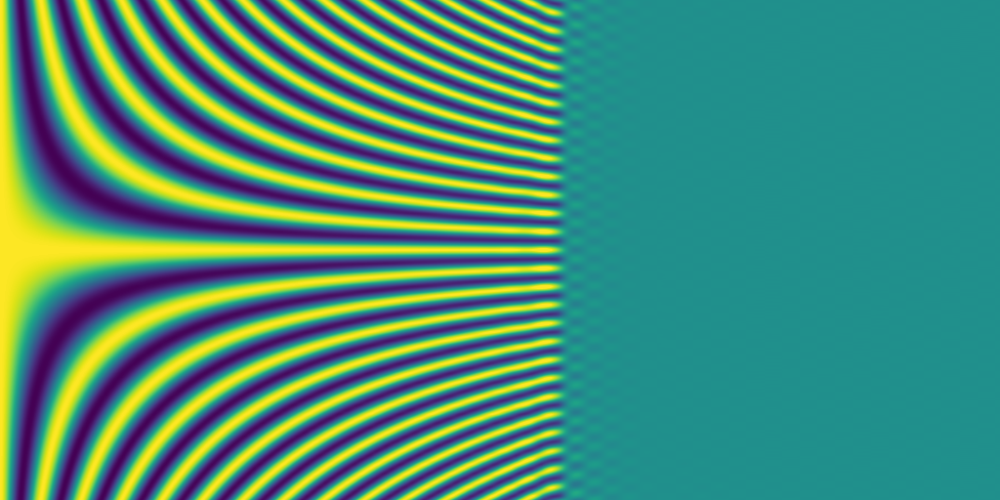

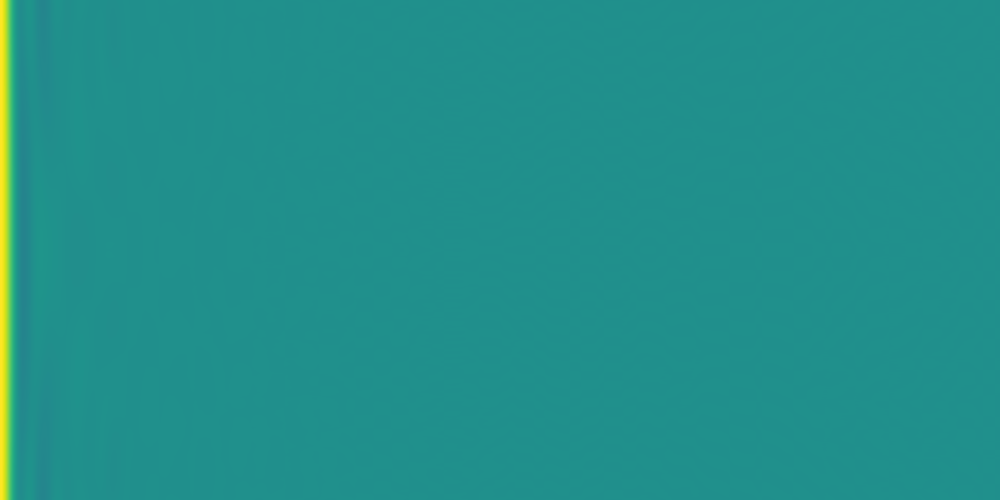

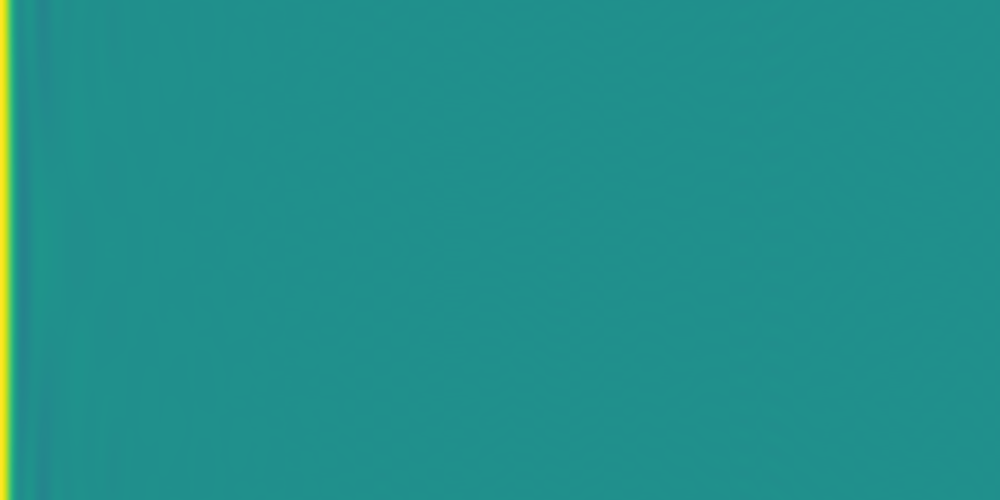

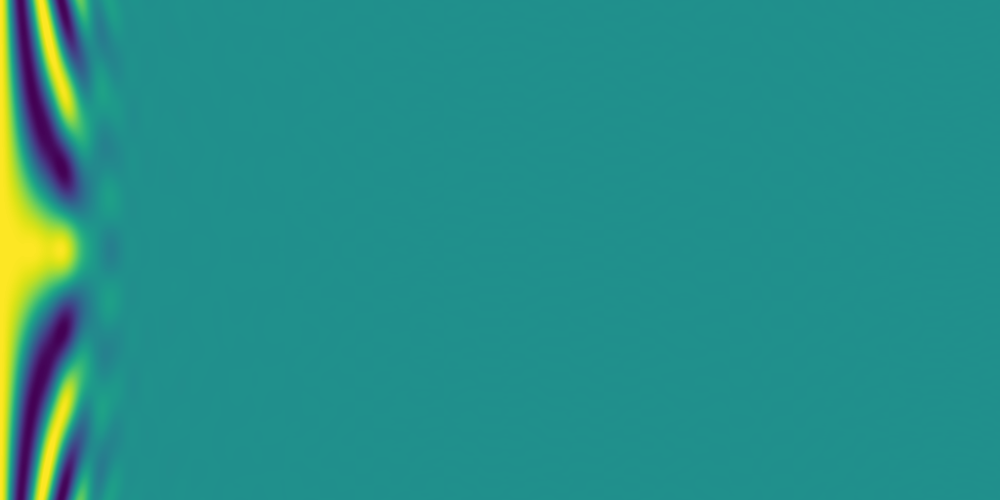

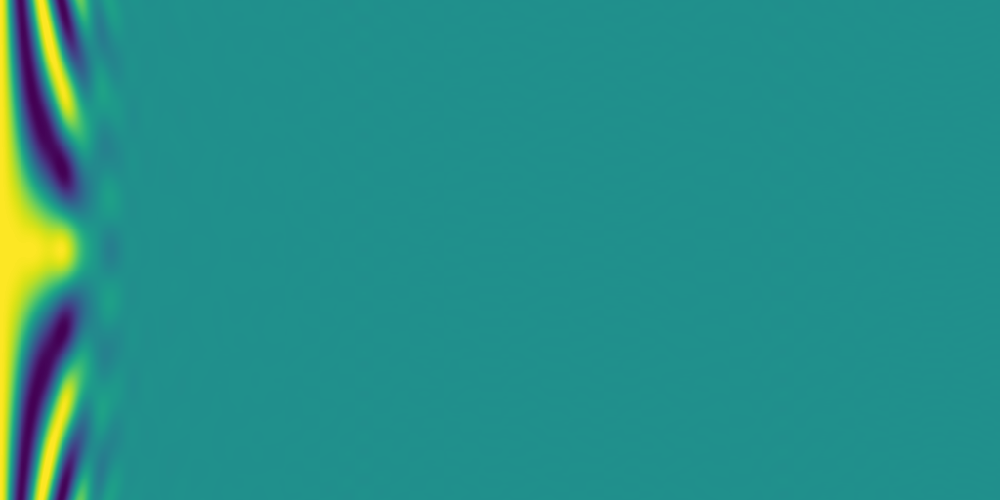

In [13]:
display_image(unfiltered_result, False)
display_image(cliped_unsinc_l_result, False)
display_image(cliped_unsinc_h_result, False)
display_image(cliped_box_result, False)
display_image(cliped_unsinc_box_result, False)
display_image(cliped_thin_hg_result, False)
display_image(cliped_unsinc_thin_hg_result, False)
display_image(cliped_thick_hg_result, False)
display_image(cliped_unsinc_thick_hg_result, False)

In [14]:
unfiltered_error = np.zeros((1024, 1024))
unsinc_l_error = np.zeros((1024, 1024))
cliped_unsinc_l_error = np.zeros((1024, 1024))
unsinc_h_error = np.zeros((1024, 1024))
cliped_unsinc_h_error = np.zeros((1024, 1024))
box_error = np.zeros((1024, 1024))
cliped_box_error = np.zeros((1024, 1024))
unsinc_box_error = np.zeros((1024, 1024))
cliped_unsinc_box_error = np.zeros((1024, 1024))
thin_hg_error = np.zeros((1024, 1024))
cliped_thin_hg_error = np.zeros((1024, 1024))
unsinc_thin_hg_error = np.zeros((1024, 1024))
cliped_unsinc_thin_hg_error = np.zeros((1024, 1024))
thick_hg_error = np.zeros((1024, 1024))
cliped_thick_hg_error = np.zeros((1024, 1024))
unsinc_thick_hg_error = np.zeros((1024, 1024))
cliped_unsinc_thick_hg_error = np.zeros((1024, 1024))

for idx_z, z_f in enumerate(tqdm(np.linspace(1.0, 200.0, 1024))):
    img_tsr = compute_imaging_tensor(x_r[..., np.newaxis, np.newaxis], ivl_a, ivl_b, z_r, z_a, z_b, z_f, pupil_diameter)

    for idx_freq, frequency in enumerate(np.linspace(0.0, 9.0, 1024)):
        signal_ab_sup = sample_lf(x_a_sup, x_b_sup, z_r, z_a, z_b, z_f, frequency)

        signal_ab = downsample_lf(signal_ab_sup, supersampling, 1.0, True)
        result = apply_imaging_tensor(img_tsr, signal_ab).get()
        unfiltered_error[idx_freq, idx_z] = np.sum(np.square(result - ground_truth[idx_freq]))





        signal_ab_sup = sample_lf(x_a_sup, x_b_sup, z_r, z_a, z_b, z_f, frequency)


        signal_ab = downsample_lf(signal_ab_sup, supersampling, 1.0, True)
        result = apply_imaging_tensor(img_tsr, signal_ab).get()
        unfiltered_error[idx_freq, idx_z] = np.sum(np.square(result - ground_truth[idx_freq]))



        signal_ab = downsample_lf(signal_ab_sup, supersampling, cp.clip(unsinc_filter, -2.0, 2.0), False)
        result = apply_imaging_tensor(img_tsr, signal_ab).get()
        unsinc_l_error[idx_freq, idx_z] = np.sum(np.square(result - ground_truth[idx_freq]))

        signal_ab = downsample_lf(signal_ab_sup, supersampling, cp.clip(unsinc_filter, -2.0, 2.0), True)
        result = apply_imaging_tensor(img_tsr, signal_ab).get()
        cliped_unsinc_l_error[idx_freq, idx_z] = np.sum(np.square(result - ground_truth[idx_freq]))


        signal_ab = downsample_lf(signal_ab_sup, supersampling, cp.clip(unsinc_filter, -10.0, 10.0), False)
        result = apply_imaging_tensor(img_tsr, signal_ab).get()
        unsinc_h_error[idx_freq, idx_z] = np.sum(np.square(result - ground_truth[idx_freq]))

        signal_ab = downsample_lf(signal_ab_sup, supersampling, cp.clip(unsinc_filter, -10.0, 10.0), True)
        result = apply_imaging_tensor(img_tsr, signal_ab).get()
        cliped_unsinc_h_error[idx_freq, idx_z] = np.sum(np.square(result - ground_truth[idx_freq]))



        signal_ab = downsample_lf(signal_ab_sup, supersampling, box_filter, False)
        result = apply_imaging_tensor(img_tsr, signal_ab).get()
        box_error[idx_freq, idx_z] = np.sum(np.square(result - ground_truth[idx_freq]))

        signal_ab = downsample_lf(signal_ab_sup, supersampling, box_filter, True)
        result = apply_imaging_tensor(img_tsr, signal_ab).get()
        cliped_box_error[idx_freq, idx_z] = np.sum(np.square(result - ground_truth[idx_freq]))


        signal_ab = downsample_lf(signal_ab_sup, supersampling, unsinc_box_filter, False)
        result = apply_imaging_tensor(img_tsr, signal_ab).get()
        unsinc_box_error[idx_freq, idx_z] = np.sum(np.square(result - ground_truth[idx_freq]))

        signal_ab = downsample_lf(signal_ab_sup, supersampling, unsinc_box_filter, True)
        result = apply_imaging_tensor(img_tsr, signal_ab).get()
        cliped_unsinc_box_error[idx_freq, idx_z] = np.sum(np.square(result - ground_truth[idx_freq]))



        signal_ab = downsample_lf(signal_ab_sup, supersampling, thin_hg_filter, False)
        result = apply_imaging_tensor(img_tsr, signal_ab).get()
        thin_hg_error[idx_freq, idx_z] = np.sum(np.square(result - ground_truth[idx_freq]))

        signal_ab = downsample_lf(signal_ab_sup, supersampling, thin_hg_filter, True)
        result = apply_imaging_tensor(img_tsr, signal_ab).get()
        cliped_thin_hg_error[idx_freq, idx_z] = np.sum(np.square(result - ground_truth[idx_freq]))


        signal_ab = downsample_lf(signal_ab_sup, supersampling, unsinc_thin_hg_filter, False)
        result = apply_imaging_tensor(img_tsr, signal_ab).get()
        unsinc_thin_hg_error[idx_freq, idx_z] = np.sum(np.square(result - ground_truth[idx_freq]))

        signal_ab = downsample_lf(signal_ab_sup, supersampling, unsinc_thin_hg_filter, True)
        result = apply_imaging_tensor(img_tsr, signal_ab).get()
        cliped_unsinc_thin_hg_error[idx_freq, idx_z] = np.sum(np.square(result - ground_truth[idx_freq]))



        signal_ab = downsample_lf(signal_ab_sup, supersampling, thick_hg_filter, False)
        result = apply_imaging_tensor(img_tsr, signal_ab).get()
        thick_hg_error[idx_freq, idx_z] = np.sum(np.square(result - ground_truth[idx_freq]))

        signal_ab = downsample_lf(signal_ab_sup, supersampling, thick_hg_filter, True)
        result = apply_imaging_tensor(img_tsr, signal_ab).get()
        cliped_thick_hg_error[idx_freq, idx_z] = np.sum(np.square(result - ground_truth[idx_freq]))


        signal_ab = downsample_lf(signal_ab_sup, supersampling, unsinc_thick_hg_filter, False)
        result = apply_imaging_tensor(img_tsr, signal_ab).get()
        unsinc_thick_hg_error[idx_freq, idx_z] = np.sum(np.square(result - ground_truth[idx_freq]))

        signal_ab = downsample_lf(signal_ab_sup, supersampling, unsinc_thick_hg_filter, True)
        result = apply_imaging_tensor(img_tsr, signal_ab).get()
        cliped_unsinc_thick_hg_error[idx_freq, idx_z] = np.sum(np.square(result - ground_truth[idx_freq]))

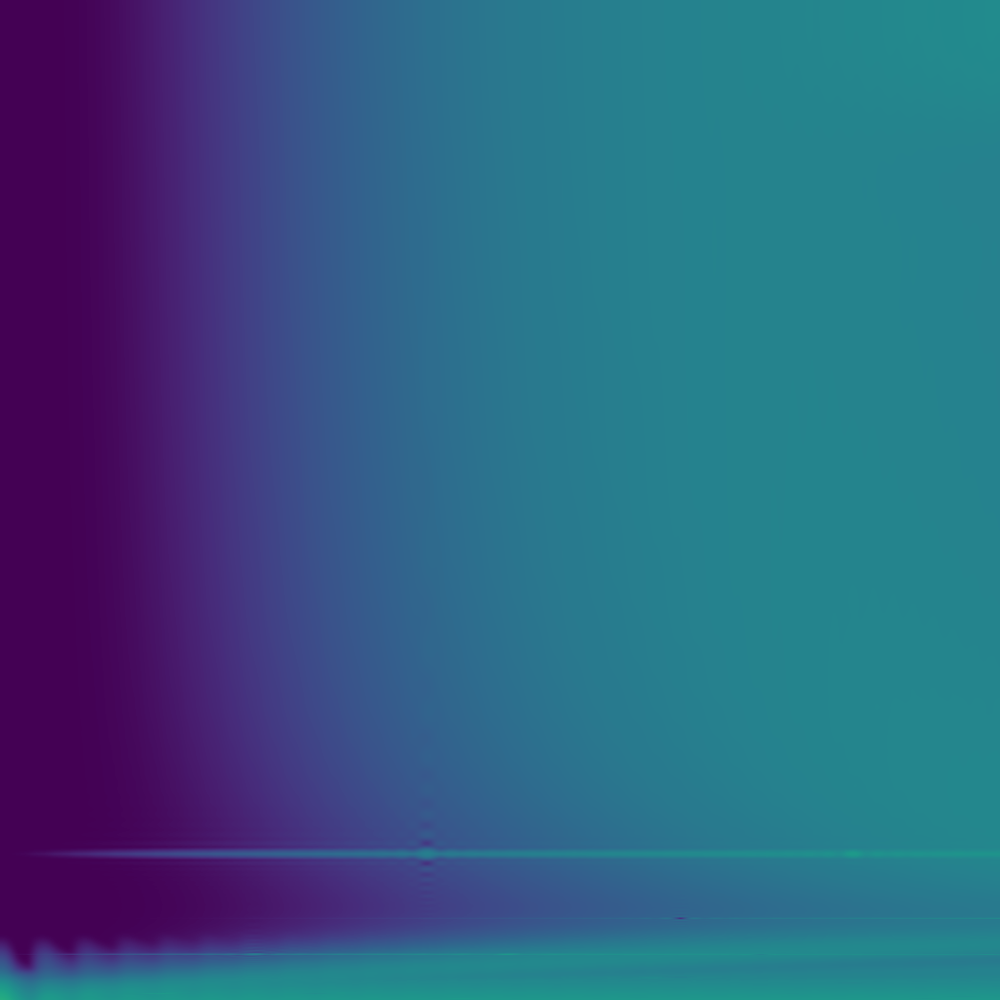

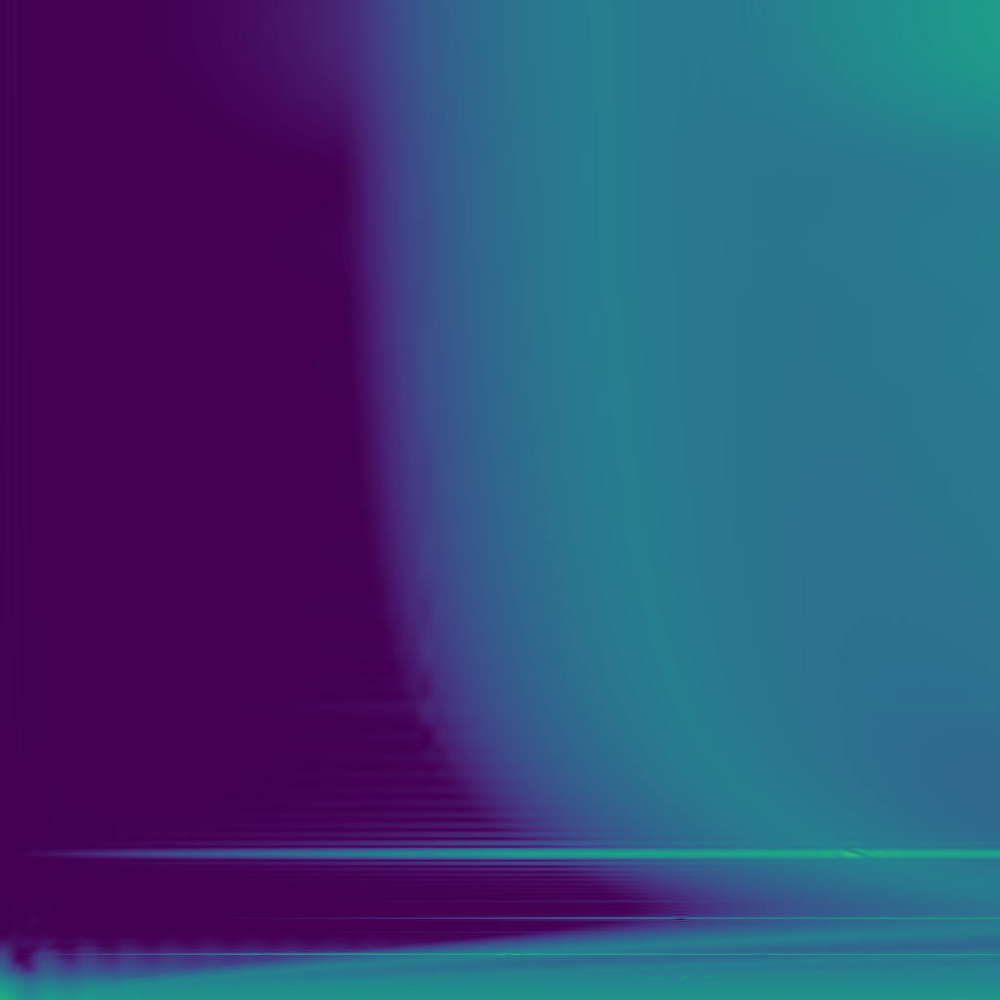

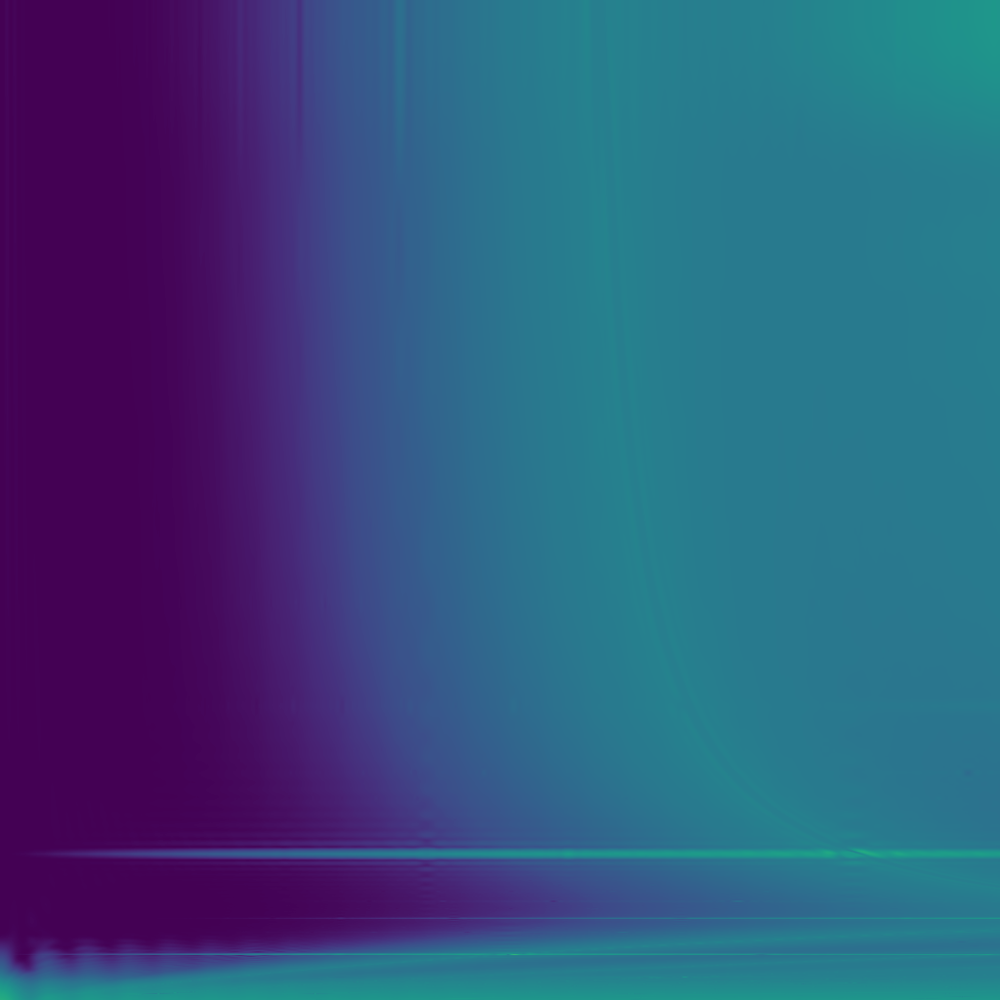

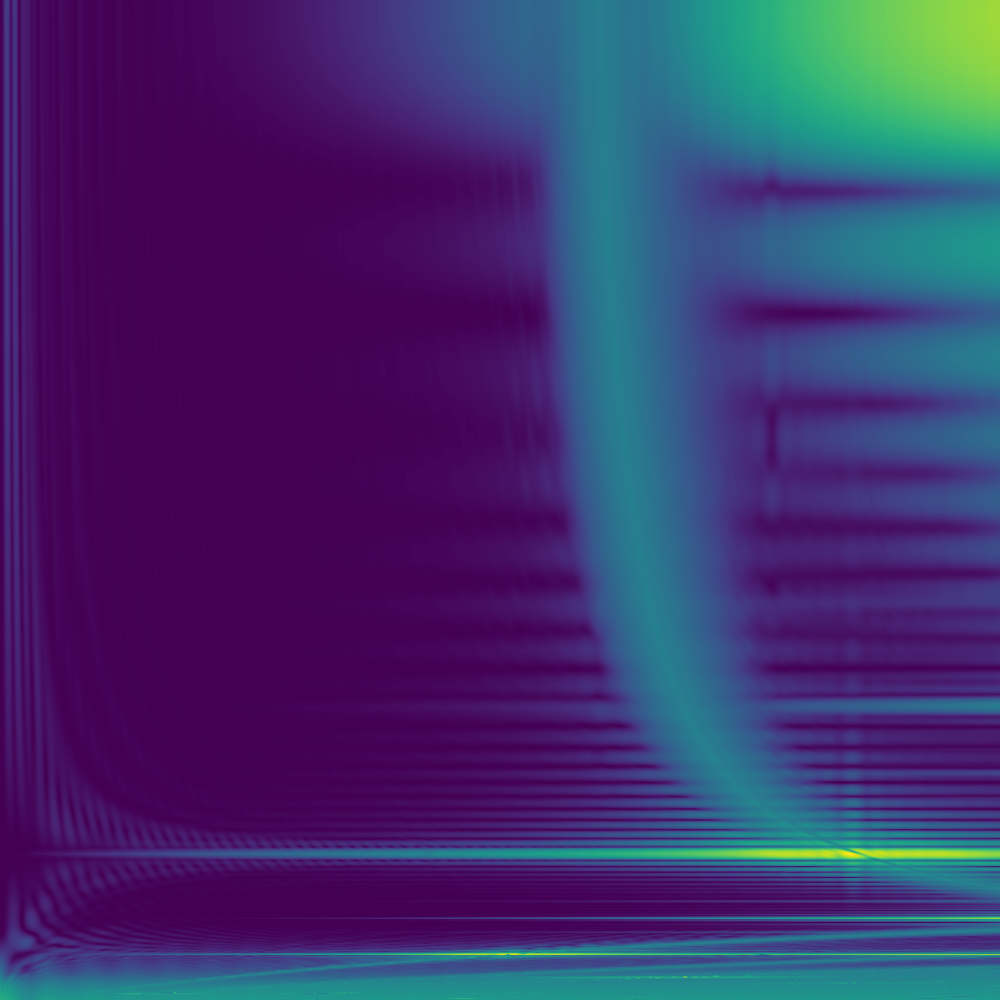

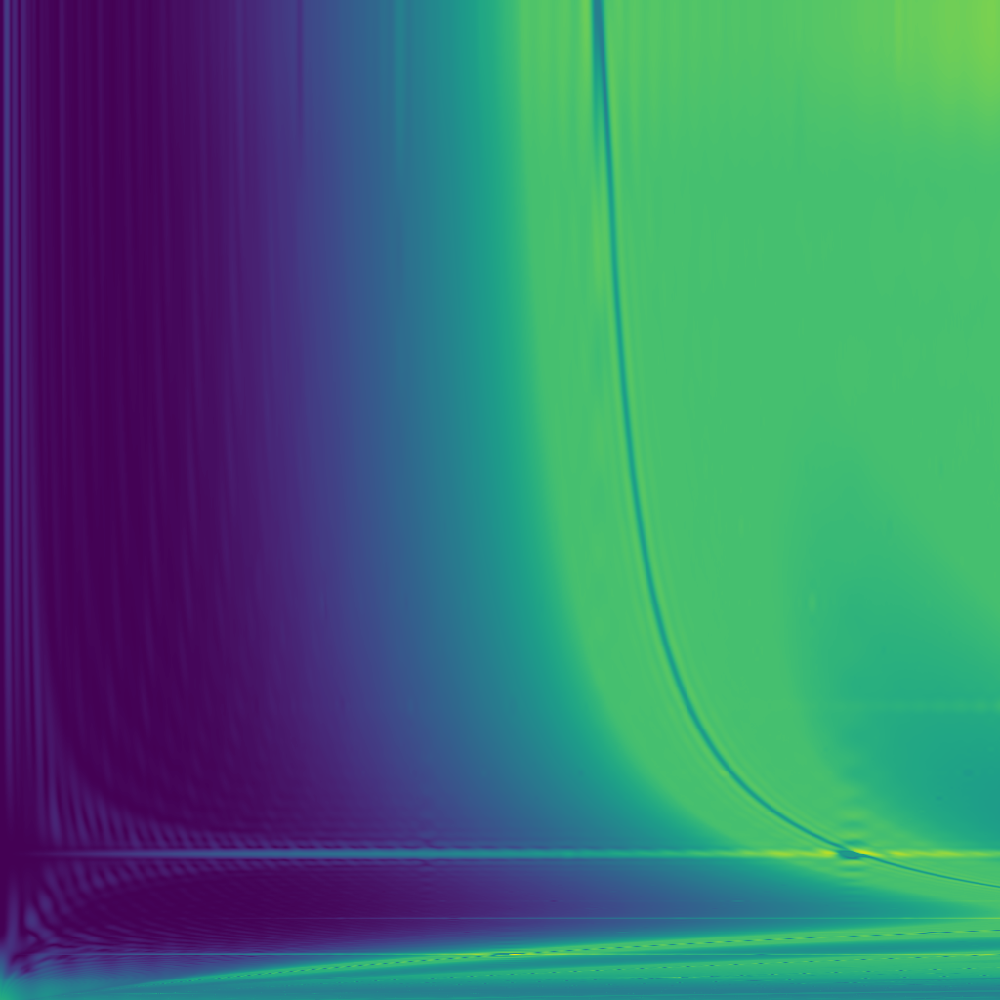

...

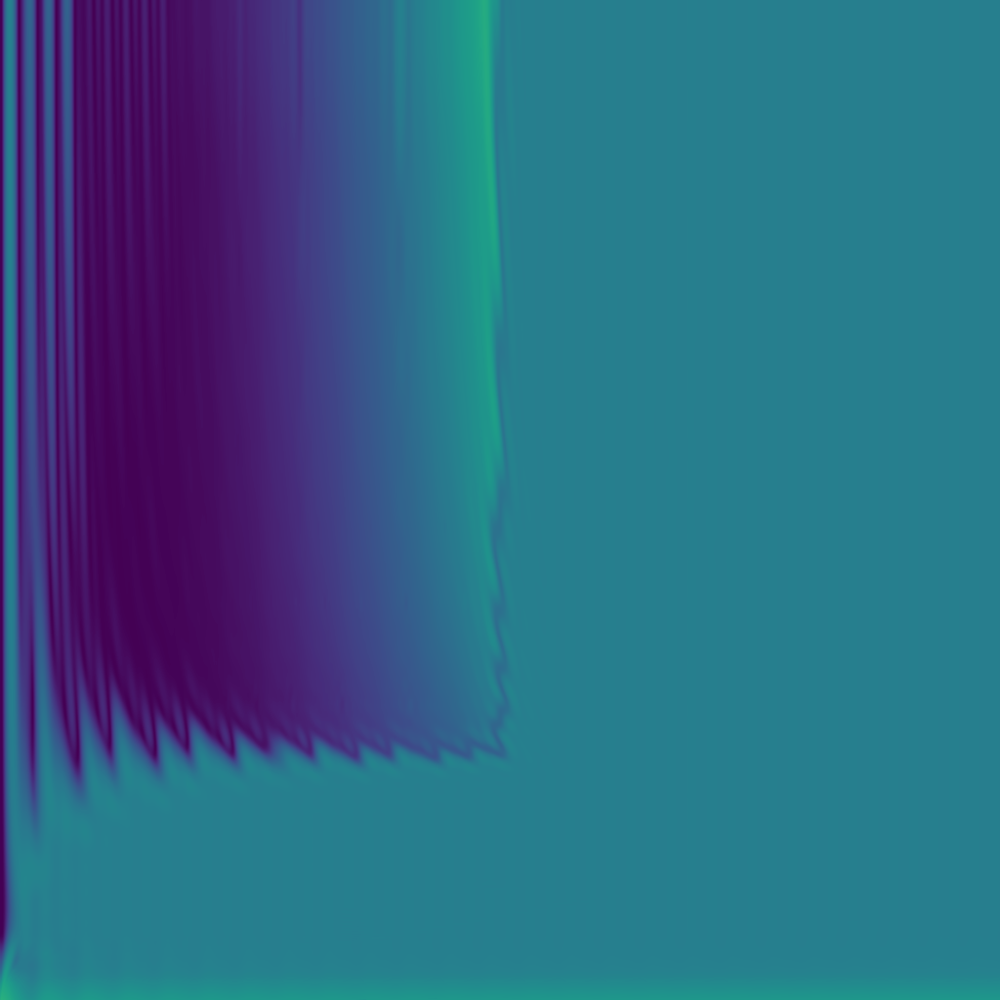

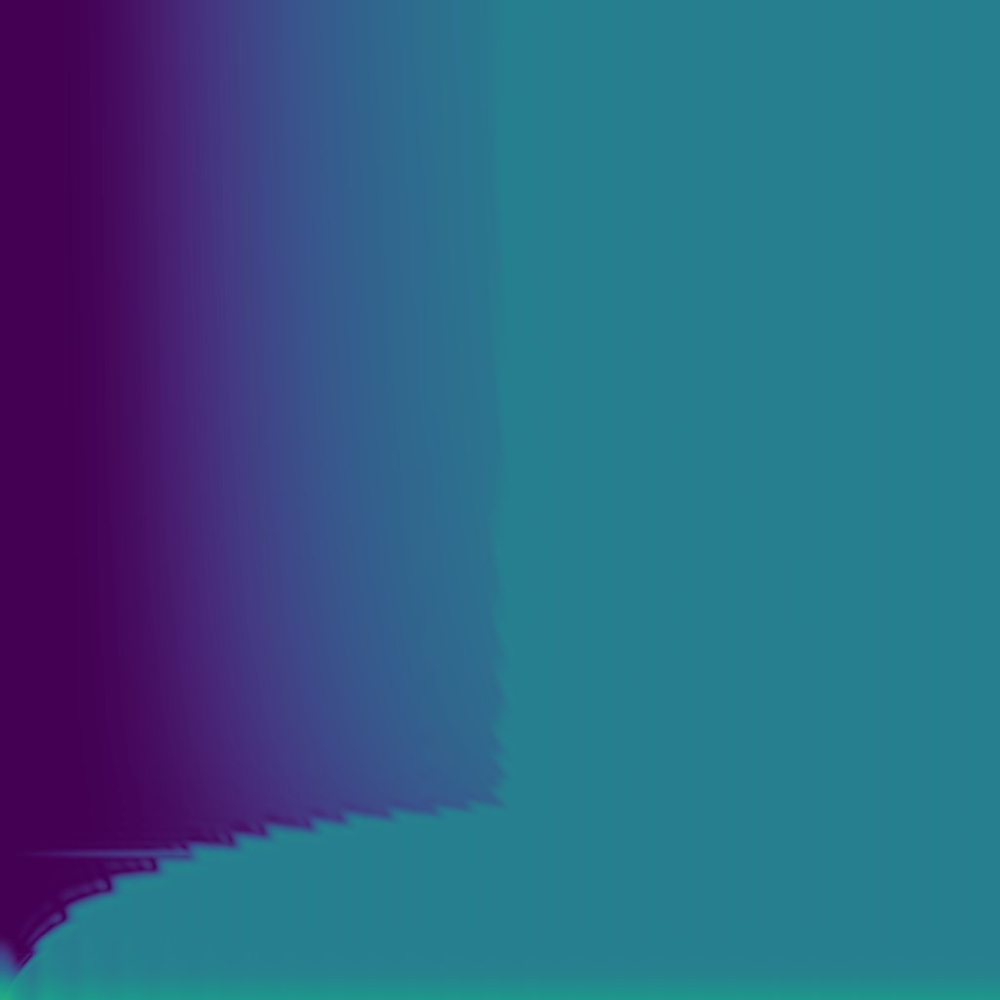

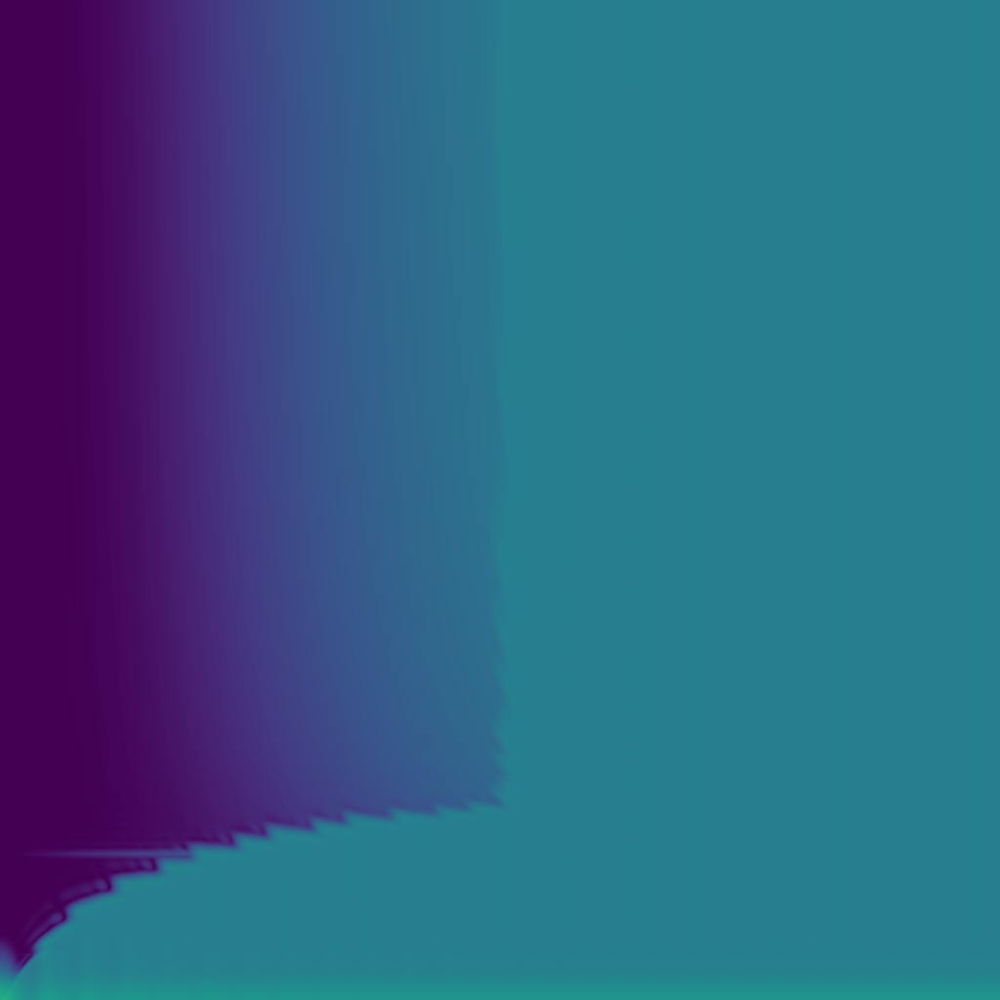

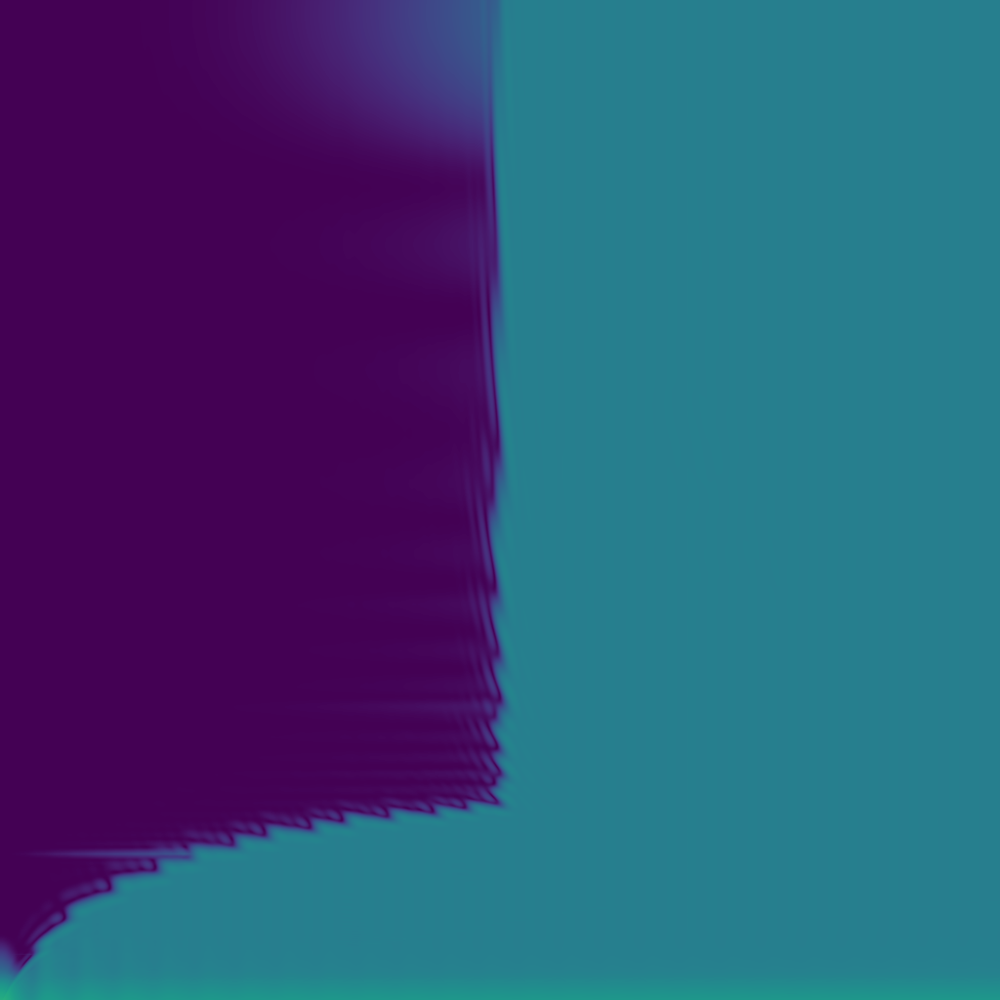

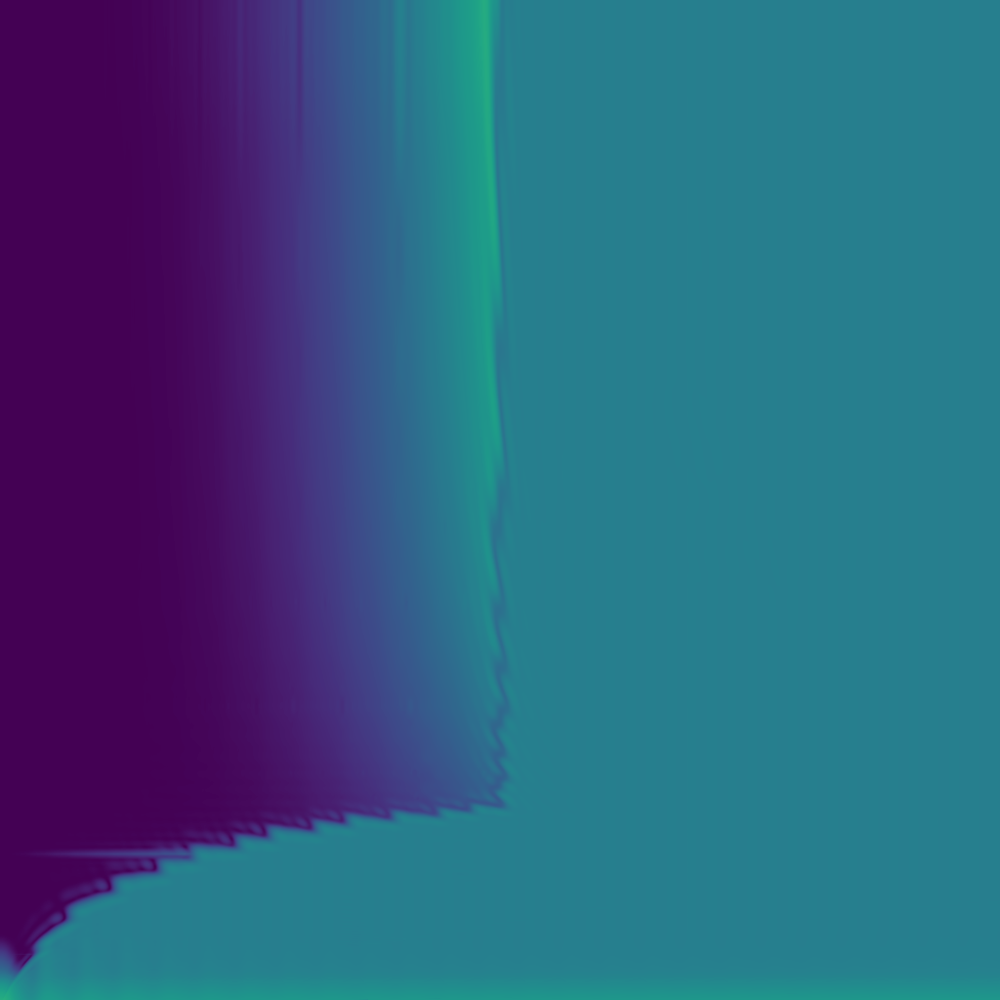

In [15]:
max_error = max(np.amax(np.log(1+unfiltered_error)),
                np.amax(np.log(1+unsinc_l_error)),
                np.amax(np.log(1+cliped_unsinc_l_error)),
                np.amax(np.log(1+unsinc_h_error)),
                np.amax(np.log(1+cliped_unsinc_h_error)),
                np.amax(np.log(1+box_error)),
                np.amax(np.log(1+cliped_box_error)),
                np.amax(np.log(1+unsinc_box_error)),
                np.amax(np.log(1+cliped_unsinc_box_error)),
                np.amax(np.log(1+thin_hg_error)),
                np.amax(np.log(1+cliped_thin_hg_error)),
                np.amax(np.log(1+unsinc_thin_hg_error)),
                np.amax(np.log(1+cliped_unsinc_thin_hg_error)),
                np.amax(np.log(1+thick_hg_error)),
                np.amax(np.log(1+cliped_thick_hg_error)),
                np.amax(np.log(1+unsinc_thick_hg_error)),
                np.amax(np.log(1+cliped_unsinc_thick_hg_error)))

display_image(np.log(1+unfiltered_error)/max_error, False)
display_image(np.log(1+unsinc_l_error)/max_error, False)
display_image(np.log(1+cliped_unsinc_l_error)/max_error, False)
display_image(np.log(1+unsinc_h_error)/max_error, False)
display_image(np.log(1+cliped_unsinc_h_error)/max_error, False)
display_image(np.log(1+box_error)/max_error, False)
display_image(np.log(1+cliped_box_error)/max_error, False)
display_image(np.log(1+unsinc_box_error)/max_error, False)
display_image(np.log(1+cliped_unsinc_box_error)/max_error, False)
display_image(np.log(1+thin_hg_error)/max_error, False)
display_image(np.log(1+cliped_thin_hg_error)/max_error, False)
display_image(np.log(1+unsinc_thin_hg_error)/max_error, False)
display_image(np.log(1+cliped_unsinc_thin_hg_error)/max_error, False)
display_image(np.log(1+thick_hg_error)/max_error, False)
display_image(np.log(1+cliped_thick_hg_error)/max_error, False)
display_image(np.log(1+unsinc_thick_hg_error)/max_error, False)
display_image(np.log(1+cliped_unsinc_thick_hg_error)/max_error, False)

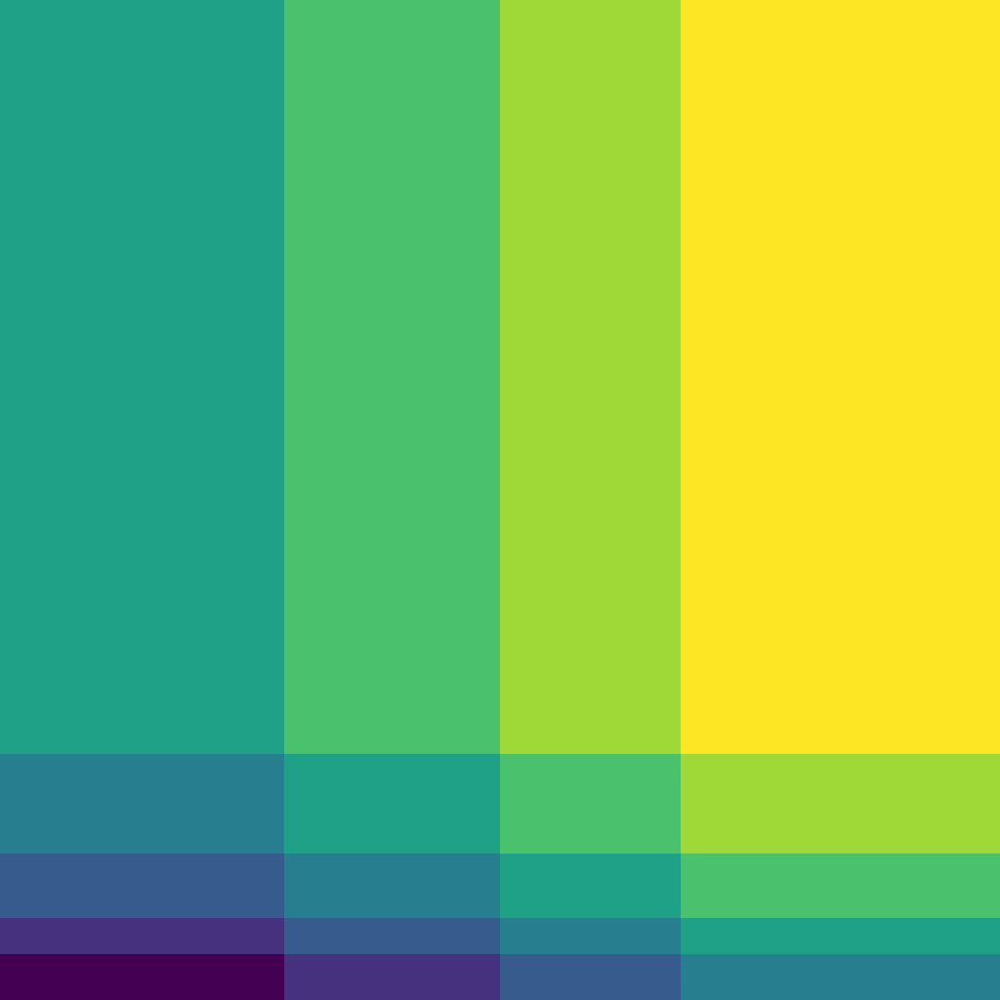

In [16]:
box_opt = (z_a * xi_a + z_b * xi_b) / (xi_a + xi_b)
box_opt_frequency = (z_a * xi_a + z_b * xi_b) / abs(z_r)
box_inf_frequency = min(xi_a, xi_b) * (z_b - z_a) / abs(z_r)

omega_a = -xi_b * (1 - z_b/z_far) / (1 - z_a/z_far)

focus_distances = [z_a, box_opt, z_b, z_near]
frequencies = [box_inf_frequency, 4.5, box_opt_frequency]

reference = np.zeros((1024, 1024))
reference_z = np.linspace(1.0, 200.0, 1024)
reference_omega = np.linspace(0.0, 9.0, 1024)

for z_f in focus_distances:
    reference += reference_z > z_f

for frequency in frequencies:
    reference += (reference_omega > frequency)[:, np.newaxis]

display_image(reference)